In [ ]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import re
import string
import nltk
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.dummy import DummyClassifier
from sklearn.metrics import precision_score, recall_score, confusion_matrix
from sklearn.metrics import f1_score, roc_auc_score, roc_curve

print("Setup Complete")

Setup Complete


In [ ]:
%tensorflow_version 2.x
import tensorflow as tf
print(tf.__version__)

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
2.15.0


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from wordcloud import WordCloud

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.naive_bayes import BernoulliNB, MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import roc_auc_score, accuracy_score
from sklearn.pipeline import Pipeline

from bs4 import BeautifulSoup
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import SnowballStemmer, WordNetLemmatizer
from nltk import sent_tokenize, word_tokenize, pos_tag

import logging
from gensim.models import word2vec
from gensim.models.keyedvectors import KeyedVectors

from keras.preprocessing import sequence
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Lambda, Embedding
from keras.layers import LSTM, SimpleRNN, GRU
from keras.preprocessing.text import Tokenizer
from collections import defaultdict
from keras.layers import Conv1D
from keras import backend as K
from keras.callbacks import EarlyStopping

print("Setup Complete")

Setup Complete


In [ ]:
import pandas as pd
data = pd.read_csv('/content/amazon_reviews.csv')

In [ ]:
data.head()

,Unnamed: 0,reviewerName,overall,reviewText,reviewTime,day_diff,helpful_yes,helpful_no,total_vote,score_pos_neg_diff,score_average_rating,wilson_lower_bound
0,0,NaN,4.0,No issues.,2014-07-23,138,0,0,0,0,0.0,0.0
1,1,0mie,5.0,"Purchased this for my device, it worked as adv...",2013-10-25,409,0,0,0,0,0.0,0.0
2,2,1K3,4.0,it works as expected. I should have sprung for...,2012-12-23,715,0,0,0,0,0.0,0.0
3,3,1m2,5.0,This think has worked out great.Had a diff. br...,2013-11-21,382,0,0,0,0,0.0,0.0
4,4,2&amp;1/2Men,5.0,"Bought it with Retail Packaging, arrived legit...",2013-07-13,513,0,0,0,0,0.0,0.0


In [ ]:
data1 = data[["overall", "reviewText"]]

In [ ]:
data1.head()

,overall,reviewText
0,4.0,No issues.
1,5.0,"Purchased this for my device, it worked as adv..."
2,4.0,it works as expected. I should have sprung for...
3,5.0,This think has worked out great.Had a diff. br...
4,5.0,"Bought it with Retail Packaging, arrived legit..."


In [ ]:
data1.index = pd.Series(list(range(data1.shape[0])))

In [ ]:
print('Shape : ',data1.shape)
data1.head()

Shape :  (4915, 2)


,overall,reviewText
0,4.0,No issues.
1,5.0,"Purchased this for my device, it worked as adv..."
2,4.0,it works as expected. I should have sprung for...
3,5.0,This think has worked out great.Had a diff. br...
4,5.0,"Bought it with Retail Packaging, arrived legit..."


In [ ]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import nltk

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

wordnet_lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))


def preprocess(document):
    if isinstance(document, str):
        document = document.lower()  # Convert to lowercase
        words = word_tokenize(document)  # Tokenize into words
        words = [w for w in words if not w in stop_words]  # Remove stopwords
        words = [wordnet_lemmatizer.lemmatize(w) for w in words]  # Lemmatize words
        return " ".join(words)  # Rejoin words into a string
    else:
        return ''  # Return empty string for non-string values


data1['Preprocessed_Review'] = data1['reviewText'].apply(preprocess)
data1.head()


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


,overall,reviewText,Preprocessed_Review
0,4.0,No issues.,issue .
1,5.0,"Purchased this for my device, it worked as adv...","purchased device , worked advertised . never m..."
2,4.0,it works as expected. I should have sprung for...,work expected . sprung higher capacity . think...
3,5.0,This think has worked out great.Had a diff. br...,think worked great.had diff . bran 64gb card w...
4,5.0,"Bought it with Retail Packaging, arrived legit...","bought retail packaging , arrived legit , oran..."


In [ ]:
data2 = data1[["overall","Preprocessed_Review"]]
data2.head()

,overall,Preprocessed_Review
0,4.0,issue .
1,5.0,"purchased device , worked advertised . never m..."
2,4.0,work expected . sprung higher capacity . think...
3,5.0,think worked great.had diff . bran 64gb card w...
4,5.0,"bought retail packaging , arrived legit , oran..."


In [ ]:
import pandas as pd
pd.set_option('display.max_colwidth', None)  # Set the option to display full content of each column

# Now print the entire DataFrame or the specific column
print(data2['Preprocessed_Review'])


0                                                                                                                                                                                                                                                 issue .
1                                                                                                                                                     purchased device , worked advertised . never much phone memory , since download lot stuff brainer .
2                                                                                                                                                     work expected . sprung higher capacity . think made bit cheesier earlier version ; paint look clean
3                            think worked great.had diff . bran 64gb card went south 3 months.this one held pretty well since s3 , note3 . * * * update 3/21/14i 've month zero issue 's since transferred s3 note3 note2 . card reliable solid ! cheer !


In [ ]:
def textPreprocessing(data2):
  #Remove Punctuation Logic
  import string
  removePunctuation = [char for char in data2 if char not in string.punctuation]
  #Join chars to form sentences
  sentenceWithoutPunctuatuons = ''.join(removePunctuation)
  words = sentenceWithoutPunctuatuons.split()
  #StopwordRemoval
  from nltk.corpus import stopwords
  removeStopwords = [word for word in words if word.lower() not in stopwords.words('english')]

  return removeStopwords

In [ ]:
def textPreprocessing(data2):
  #Remove Punctuation Logic
  import string
  removePunctuation = [char for char in data2 if char not in string.punctuation]
  #Join chars to form sentences
  sentenceWithoutPunctuatuons = ''.join(removePunctuation)
  words = sentenceWithoutPunctuatuons.split()
  #StopwordRemoval
  from nltk.corpus import stopwords
  removeStopwords = [word for word in words if word.lower() not in stopwords.words('english')]

  return removeStopwords

In [ ]:
data2.groupby('overall').describe()

Preprocessed_Review         \
                      count unique   
overall                              
1.0                     244    244   
2.0                      80     80   
3.0                     142    142   
4.0                     527    527   
5.0                    3922   3922   

                                                                                                                                                                                                                                                     \
                                                                                                                                                                                                                                                top   
overall                                                                                                                                                                                                                                               
1.0      bought 2 sandisk 32 gb microsd , used galaxy note galaxy s4first one , phone started saying removed , recognize : ) diedi thought 's luck , plugged 2nd one : ) stayed 2 month died suddenly ! lost everythingnever buying sandisk .. ever   
2.0                                      used month phone , decided quit mounting . lost picture pet died shortly . got replacement card , send old one , giving chance recovering content . new one 's worked fine , failing 3 month inexcusable .   
3.0                                               work , file writes bit slower expected usb3 reader.also , read writes faster card inside standard-size sd adapter ( 15 mb/s v 10 write ; 45 mb/s v 22 mb/s read ) card reader . ca n't figure ...   
4.0                                                                                                                                                                                                                                         issue .   
5.0                                                                                                                                             purchased device , worked advertised . never much phone memory , since download lot stuff brainer .   

              
        freq  
overall       
1.0        1  
2.0        1  
3.0        1  
4.0        1  
5.0        1

In [ ]:
#Text PreProcessing
import pandas as pd

data2['Preprocessed_Review'].head(2).apply(textPreprocessing)

0                                                                                                      [issue]
1    [purchased, device, worked, advertised, never, much, phone, memory, since, download, lot, stuff, brainer]
Name: Preprocessed_Review, dtype: object

In [ ]:
print(data2['Preprocessed_Review'])

0                                                                                                                                                                                                                                                 issue .
1                                                                                                                                                     purchased device , worked advertised . never much phone memory , since download lot stuff brainer .
2                                                                                                                                                     work expected . sprung higher capacity . think made bit cheesier earlier version ; paint look clean
3                            think worked great.had diff . bran 64gb card went south 3 months.this one held pretty well since s3 , note3 . * * * update 3/21/14i 've month zero issue 's since transferred s3 note3 note2 . card reliable solid ! cheer !


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
bow = CountVectorizer(analyzer=textPreprocessing).fit(data2['Preprocessed_Review'])

In [ ]:
len(bow.vocabulary_)

9564

In [ ]:
reviews_bow = bow.transform(data2['Preprocessed_Review'])

In [ ]:
from sklearn.feature_extraction.text import TfidfTransformer
tfidfData = TfidfTransformer().fit(reviews_bow)
tfidfDataFinal = tfidfData.transform(reviews_bow)

In [ ]:
tfidfDataFinal.shape

(4915, 9564)

In [ ]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')

def analyze_sentiment(text):
    sid = SentimentIntensityAnalyzer()
    sentiment_scores = sid.polarity_scores(text)

    compound_score = sentiment_scores['compound']

    if compound_score >= 0.05:
        sentiment_label = 'Positive'
    elif compound_score > -0.05 and compound_score < 0.05:
        sentiment_label = 'Neutral'
    else:
        sentiment_label = 'Negative'

    return sentiment_label, compound_score

# Example usage with a list of preprocessed reviews
preprocessed_reviews = data2['Preprocessed_Review']

for review in preprocessed_reviews:
    sentiment_label, compound_score = analyze_sentiment(review)
    print(f"Sentiment for '{review}': {sentiment_label}, Compound Score: {compound_score}")


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


Sentiment for 'issue .': Neutral, Compound Score: 0.0
Sentiment for 'purchased device , worked advertised . never much phone memory , since download lot stuff brainer .': Neutral, Compound Score: 0.0
Sentiment for 'work expected . sprung higher capacity . think made bit cheesier earlier version ; paint look clean': Positive, Compound Score: 0.4019
Sentiment for 'think worked great.had diff . bran 64gb card went south 3 months.this one held pretty well since s3 , note3 . * * * update 3/21/14i 've month zero issue 's since transferred s3 note3 note2 . card reliable solid ! cheer !': Positive, Compound Score: 0.8684
Sentiment for 'bought retail packaging , arrived legit , orange envelope , english version asian like picture show . arrived quickly , bought 32 16 retail packaging htc one sv lg optimus , card working order , probably best price 'll get nice sd card': Positive, Compound Score: 0.8591
Sentiment for ''s mini storage . n't anything else 's supposed . purchased add additional sto

KeyboardInterrupt: 

overall
5.0    3922
4.0     527
1.0     244
3.0     142
2.0      80
Name: count, dtype: int64


Text(0.5, 1.0, 'Distribution of Reviews Sentiment')

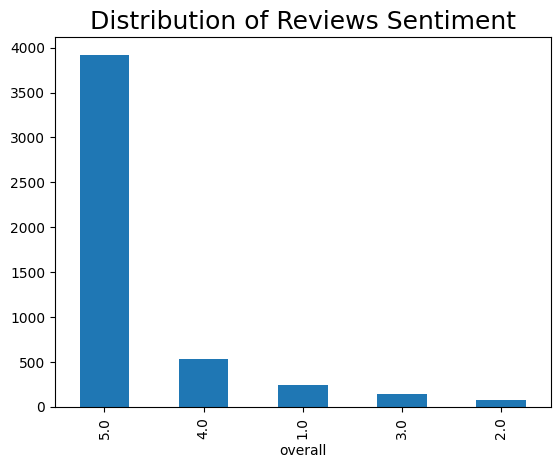

In [ ]:
# Using Matplotlib to show distribution of reviews sentiment in the dataset
print(data1.overall.value_counts())
data1['overall'].value_counts().plot(kind='bar')
plt.title("Distribution of Reviews Sentiment", size=18)

In [ ]:
#Creating independent and Dependent Features
columns = data2.columns.tolist()
# Filtering the columns to remove data we do not want
columns = [c for c in columns if c not in ["sentiment"]]
# Store the variable we are predicting
target = "overall"
# Defining a random state
state = np.random.RandomState(42)
X = data2[columns]
Y = data2[target]
# Printing the shapes of X & Y
print(X.shape)
print(Y.shape)

(4915, 2)
(4915,)


In [ ]:
columns

['overall', 'Preprocessed_Review']

In [ ]:
print(data2.overall.value_counts())

overall
5.0    3922
4.0     527
1.0     244
3.0     142
2.0      80
Name: count, dtype: int64


In [ ]:
# RandomOverSampler to handle imbalanced data
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
X_res,Y_res=ros.fit_resample(X,Y)

In [ ]:
from collections import Counter
print(sorted(Counter(Y_res).items()))

[(1.0, 3922), (2.0, 3922), (3.0, 3922), (4.0, 3922), (5.0, 3922)]


In [ ]:
X_res.shape,Y_res.shape


((19610, 2), (19610,))

In [ ]:
#Checking out both old & new data
print('Original dataset shape {}'.format(Counter(Y)))
print('Resampled dataset shape {}'.format(Counter(Y_res)))

Original dataset shape Counter({5.0: 3922, 4.0: 527, 1.0: 244, 3.0: 142, 2.0: 80})
Resampled dataset shape Counter({4.0: 3922, 5.0: 3922, 3.0: 3922, 1.0: 3922, 2.0: 3922})


In [ ]:
#Creating X output to dataframe
X1=pd.DataFrame(X_res,columns=['Preprocessed_Review'])

In [ ]:
#Creating Y output to dataframe for merging
Y1=pd.DataFrame(Y_res,columns=['overall'])

In [ ]:
#Merging the X & Y output to Final data
Final_data=pd.concat([X1,Y1],axis=1)
Final_data.head()

,Preprocessed_Review,overall
0,issue .,4.0
1,"purchased device , worked advertised . never much phone memory , since download lot stuff brainer .",5.0
2,work expected . sprung higher capacity . think made bit cheesier earlier version ; paint look clean,4.0
3,"think worked great.had diff . bran 64gb card went south 3 months.this one held pretty well since s3 , note3 . * * * update 3/21/14i 've month zero issue 's since transferred s3 note3 note2 . card reliable solid ! cheer !",5.0
4,"bought retail packaging , arrived legit , orange envelope , english version asian like picture show . arrived quickly , bought 32 16 retail packaging htc one sv lg optimus , card working order , probably best price 'll get nice sd card",5.0


In [ ]:
Final_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19610 entries, 0 to 19609
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Preprocessed_Review  19610 non-null  object 
 1   overall              19610 non-null  float64
dtypes: float64(1), object(1)
memory usage: 306.5+ KB


overall
4.0    3922
5.0    3922
3.0    3922
1.0    3922
2.0    3922
Name: count, dtype: int64


Text(0.5, 1.0, 'Distribution of Reviews Sentiment')

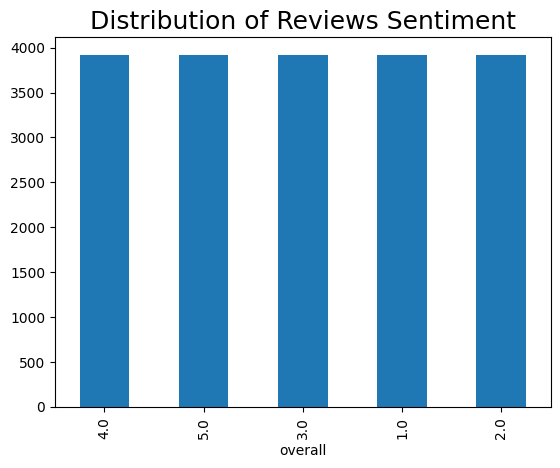

In [ ]:
# Using Matplotlib to plot the final data & show distribution of reviews sentiment in the dataset
print(Final_data.overall.value_counts())
Final_data['overall'].value_counts().plot(kind='bar')
plt.title("Distribution of Reviews Sentiment", size=18)

In [ ]:
Final_data

,Preprocessed_Review,overall
0,issue .,4.0
1,"purchased device , worked advertised . never much phone memory , since download lot stuff brainer .",5.0
2,work expected . sprung higher capacity . think made bit cheesier earlier version ; paint look clean,4.0
3,"think worked great.had diff . bran 64gb card went south 3 months.this one held pretty well since s3 , note3 . * * * update 3/21/14i 've month zero issue 's since transferred s3 note3 note2 . card reliable solid ! cheer !",5.0
4,"bought retail packaging , arrived legit , orange envelope , english version asian like picture show . arrived quickly , bought 32 16 retail packaging htc one sv lg optimus , card working order , probably best price 'll get nice sd card",5.0
...,...,...
19605,"first , 've always bought sandisk warranty reasoning lifetime warranty mean must little better others sandisk 's lesser line . 5 class 6 sd 8gb extreme iii series card pushing 5 year old zero problem , write nearly twice fast . sure limitation , class 10 uhs-1 , 5 year newer tech blow away . 'micro ' packaging n't make difference either . guess 's marketing differentiation.again card write published spec may want check sony sr32uya/tqmn capacity , read writes faster similar price , though one year warranty . picked hisense 7 pro tablet ( awesome ) could n't wait , sale locally $ 26 . pleasant surprise . came sd adapter well file recovery software ( link ) . fan sony web site support documentation gear last 15 year commodity suppose ca n't expect much longer . kind think thing work 30 day , 'll probably work 5-10 year obsolete . fyi : sandisk sony made china .",4.0
19606,sd card adapter came handy able use card father-in-law 's nikon d3200 .,4.0
19607,nice,4.0
19608,"still think sometimes problem reading memory , ca n't prove , still work , never error reading writing , 4 star !",4.0


In [ ]:
# @title CSS - JSS
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

# Assuming 'df' is your DataFrame with a 'text' column containing review text
df = Final_data['Preprocessed_Review']

# Define the TfidfVectorizer without specifying the vocabulary
vectorizer = TfidfVectorizer()

# Compute the TF-IDF matrix for the review text
tfidf = vectorizer.fit_transform(df)

# Get the vocabulary
vocabulary = vectorizer.get_feature_names_out()

# Define positive, negative, and neutral words to compute CSS and JSS scores
positive_words = ['good', 'great', 'excellent', 'happy', 'love']
negative_words = ['bad', 'terrible', 'awful', 'sad', 'hate']
neutral_words = ['the', 'and', 'is', 'of', 'to']

# Compute the CSS and JSS scores
css = np.zeros((df.shape[0], 3))
jss = np.zeros((df.shape[0], 3))

for i in range(df.shape[0]):
    for word in positive_words:
        if word in vocabulary:
            index = np.where(vocabulary == word)[0][0]
            css[i, 0] += tfidf[i, index]
            jss[i, 0] += tfidf[i, index]
    for word in negative_words:
        if word in vocabulary:
            index = np.where(vocabulary == word)[0][0]
            css[i, 1] += tfidf[i, index]
            jss[i, 1] += tfidf[i, index]
    for word in neutral_words:
        if word in vocabulary:
            index = np.where(vocabulary == word)[0][0]
            css[i, 2] += tfidf[i, index]
            jss[i, 2] += tfidf[i, index]

# Normalize the CSS and JSS scores
css = css / np.linalg.norm(css, axis=1)[:, None]
jss = jss / np.linalg.norm(jss, axis=1)[:, None]

# Add the CSS and JSS scores to the DataFrame
df['css'] = css.flatten()
df['jss'] = jss.flatten()
print(df[['css', 'jss']])

css    [nan, nan, nan, nan, nan, nan, nan, nan, nan, ...
jss    [nan, nan, nan, nan, nan, nan, nan, nan, nan, ...
Name: Preprocessed_Review, dtype: object


In [ ]:
# @title VADER
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')

def analyze_sentiment(text):
    sid = SentimentIntensityAnalyzer()
    sentiment_scores = sid.polarity_scores(text)

    compound_score = sentiment_scores['compound']

    if compound_score >= 0.05:
        sentiment_label = 'Positive'
    elif compound_score > -0.05 and compound_score < 0.05:
        sentiment_label = 'Neutral'
    else:
        sentiment_label = 'Negative'

    return sentiment_label, compound_score

# Example usage with a list of preprocessed reviews
preprocessed_reviews = Final_data['Preprocessed_Review']

for review in preprocessed_reviews:
    sentiment_label, compound_score = analyze_sentiment(review)
    print(f"Sentiment for '{review}': {sentiment_label}, Compound Score: {compound_score}")


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


Streaming output truncated to the last 5000 lines.
Sentiment for 'work worked well , one day died 3 month bought . know think happen memory card , happened another card , another story . luckily sandisk decent customer service , send new card , actually easy work , contacted email , hopefully go well end well': Positive, Compound Score: 0.8625
Sentiment for 'worked great galaxy s4 -- n't work unknown reason . used 4 month crapped . back data thing , though ....': Positive, Compound Score: 0.6249
Sentiment for 'owned one year lost ability write . disappointing , deal breaker san disk product usually built last . believe received bad one batch mine came .': Negative, Compound Score: -0.7717
Sentiment for 'um nothing much really say . adapter work gave 3 star go n sometimes': Neutral, Compound Score: 0.0
Sentiment for 'great little card . problem experienced may even related card , android o . experience buffering/'hiccups'/pauses watching video also utorrent client background downloading

In [ ]:
df = Final_data.sample(frac=0.1, random_state=0)

# Dropping missing values
df.dropna(inplace=True)

df.head()

,Preprocessed_Review,overall
14827,n't work s2 skyrocket work xoom . odd suffer . seems class 4. get sandisk unless ton cheaper . 1 stolen tweakers suck,3.0
7960,"maybe got defective card one felt bit & # 34 ; thinner & # 34 ; & # 34 ; flimsier & # 34 ; micro-sd card 've had.the real problem week use expanded storage tablet , started trouble certain program installed card , finally tablet gave message card corrupt , pc would recognize , eery time tried format card , would error .",1.0
15548,problem size mini card -- hard hold get drift camera get stuck time,3.0
8851,"hard review card arrived doa . could n't write , would n't format . returned amazon great credit . 've owned several sandisk memory card performed well little surprised one failed box . 'd read good review samsung 64gb micro card bought instead . pleased .",2.0
15854,writes according sandisk app test speed 16mb/second . expected little .,3.0


In [ ]:
# Splitting data into training set and validation
X_train, X_test, y_train, y_test = train_test_split(df['Preprocessed_Review'], df['overall'], \
                                                    test_size=0.1, random_state=0)

print('Load %d training examples and %d validation examples. \n' %(X_train.shape[0],X_test.shape[0]))
print('Show a review in the training set : \n', X_train.iloc[10])

Load 1764 training examples and 197 validation examples. 

Show a review in the training set : 
 received two today `` made china '' imprinted . although detected formatted fine capacity samsung phone tablet , let see hold suffer premature death like many reported . thinking 've gone `` made korea '' samsung sd card instead 64gb size.update : bought two 12/2012 one year later light use one card started locking phone `` wait close '' prompt deleting file . 've gone made south korea samsung card . sandisk garbage day .


In [ ]:
def cleanText(raw_text, remove_stopwords=False, stemming=False, split_text=False, \
             ):
    '''
    Convert a raw review to a cleaned review
    '''
    text = BeautifulSoup(raw_text, 'lxml').get_text()  #remove html
    letters_only = re.sub("[^a-zA-Z]", " ", text)  # remove non-character
    words = letters_only.lower().split() # convert to lower case

    if remove_stopwords: # remove stopword
        stops = set(stopwords.words("english"))
        words = [w for w in words if not w in stops]

    if stemming==True: # stemming
#         stemmer = PorterStemmer()
        stemmer = SnowballStemmer('english')
        words = [stemmer.stem(w) for w in words]

    if split_text==True:  # split text
        return (words)

    return( " ".join(words))

In [ ]:
# Preprocess text data in training set and validation set
X_train_cleaned = []
X_test_cleaned = []

for d in X_train:
    X_train_cleaned.append(cleanText(d))
print('Show a cleaned review in the training set : \n',  X_train_cleaned[10])

for d in X_test:
    X_test_cleaned.append(cleanText(d))

Show a cleaned review in the training set : 
 received two today made china imprinted although detected formatted fine capacity samsung phone tablet let see hold suffer premature death like many reported thinking ve gone made korea samsung sd card instead gb size update bought two one year later light use one card started locking phone wait close prompt deleting file ve gone made south korea samsung card sandisk garbage day


In [ ]:
# Fit and transform the training data to a document-term matrix using CountVectorizer
countVect = CountVectorizer()
X_train_countVect = countVect.fit_transform(X_train_cleaned)
print("Number of features: %d \n" % len(countVect.get_feature_names_out()))  # 6378
print("Show some feature names: \n", countVect.get_feature_names_out()[::1000])

# Train MultinomialNB classifier
mnb = MultinomialNB()
mnb.fit(X_train_countVect, y_train)

Number of features: 3799 

Show some feature names: 
 ['ability' 'enterprise' 'misleading' 'shutter']


MultinomialNB()

In [ ]:
def modelEvaluation(predictions):
    '''
    Print model evaluation to predicted result
    '''
    print ("\nAccuracy on validation set: {:.4f}".format(accuracy_score(y_test, predictions)))
    #print("\nAUC score : {:.4f}".format(roc_auc_score(y_test, predictions)))
    print("\nClassification report : \n", metrics.classification_report(y_test, predictions))
    print("\nConfusion Matrix : \n", metrics.confusion_matrix(y_test, predictions))

In [ ]:
# Evaluate the model on validaton set
predictions = mnb.predict(countVect.transform(X_test_cleaned))
modelEvaluation(predictions)


Accuracy on validation set: 0.7056

Classification report : 
               precision    recall  f1-score   support

         1.0       0.74      0.90      0.81        39
         2.0       0.95      0.89      0.92        44
         3.0       0.61      0.68      0.64        40
         4.0       0.54      0.53      0.53        38
         5.0       0.64      0.50      0.56        36

    accuracy                           0.71       197
   macro avg       0.70      0.70      0.69       197
weighted avg       0.71      0.71      0.70       197


Confusion Matrix : 
 [[35  0  4  0  0]
 [ 2 39  2  0  1]
 [ 5  1 27  4  3]
 [ 4  1  7 20  6]
 [ 1  0  4 13 18]]


In [ ]:
# Fitting and transforming the training data to a document-term matrix using TfidfVectorizer
tfidf = TfidfVectorizer(min_df=5) #minimum document frequency of 5
X_train_tfidf = tfidf.fit_transform(X_train)
print("Number of features : %d \n" %len(tfidf.get_feature_names_out())) #1722
print("Show some feature names : \n", tfidf.get_feature_names_out()[::1000])

# Logistic Regression
lr = LogisticRegression()
lr.fit(X_train_tfidf, y_train)

Number of features : 1759 

Show some feature names : 
 ['00' 'mp4']


LogisticRegression()

In [ ]:
# Have a look at the top 10 features with the smallest and largest coefficients
feature_names = np.array(tfidf.get_feature_names_out())
sorted_coef_index = lr.coef_[0].argsort()
print('\nTop 10 features with the smallest coefficients:\n{}\n'.format(feature_names[sorted_coef_index[:10]]))
print('Top 10 features with the largest coefficients:\n{}'.format(feature_names[sorted_coef_index[:-11:-1]]))



Top 10 features with the smallest coefficients:
['great' 'need' 'fast' 'tablet' 'adapter' 'working' 'well' 'gb' 'price'
 'speed']

Top 10 features with the largest coefficients:
['error' 'got' 'data' 'card' 'died' 'even' 'dead' 'refund' 'lost' 'hot']


In [ ]:
# Evaluating on the validaton set
predictions = lr.predict(tfidf.transform(X_test_cleaned))
modelEvaluation(predictions)


Accuracy on validation set: 0.7513

Classification report : 
               precision    recall  f1-score   support

         1.0       0.84      0.79      0.82        39
         2.0       0.89      0.93      0.91        44
         3.0       0.75      0.82      0.79        40
         4.0       0.62      0.55      0.58        38
         5.0       0.61      0.61      0.61        36

    accuracy                           0.75       197
   macro avg       0.74      0.74      0.74       197
weighted avg       0.75      0.75      0.75       197


Confusion Matrix : 
 [[31  1  4  1  2]
 [ 2 41  0  0  1]
 [ 1  4 33  2  0]
 [ 3  0  3 21 11]
 [ 0  0  4 10 22]]


In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
#Splitting review text into parsed sentences using NLTK's punkt tokenizer

tokenizer = nltk.data.load('tokenizers/punkt/english.pickle')
def parseSent(review, tokenizer, remove_stopwords=False):
    '''
    Parse text into sentences
    '''
    raw_sentences = tokenizer.tokenize(review.strip())
    sentences = []
    for raw_sentence in raw_sentences:
        if len(raw_sentence) > 0:
            sentences.append(cleanText(raw_sentence, remove_stopwords, split_text=True))
    return sentences


# Parsing each review in the training set into sentences
sentences = []
for review in X_train_cleaned:
    sentences += parseSent(review, tokenizer)

print('%d parsed sentence in the training set\n'  %len(sentences))
print('Show a parsed sentence in the training set : \n',  sentences[10])

1764 parsed sentence in the training set

Show a parsed sentence in the training set : 
 ['received', 'two', 'today', 'made', 'china', 'imprinted', 'although', 'detected', 'formatted', 'fine', 'capacity', 'samsung', 'phone', 'tablet', 'let', 'see', 'hold', 'suffer', 'premature', 'death', 'like', 'many', 'reported', 'thinking', 've', 'gone', 'made', 'korea', 'samsung', 'sd', 'card', 'instead', 'gb', 'size', 'update', 'bought', 'two', 'one', 'year', 'later', 'light', 'use', 'one', 'card', 'started', 'locking', 'phone', 'wait', 'close', 'prompt', 'deleting', 'file', 've', 'gone', 'made', 'south', 'korea', 'samsung', 'card', 'sandisk', 'garbage', 'day']


In [ ]:
from gensim.models import Word2Vec
w2v = Word2Vec()

In [ ]:
# @title Word2Vec
from gensim.models import Word2Vec
import numpy as np

preprocessed_sentences = Final_data['Preprocessed_Review']

# Define Word2Vec model parameters
num_features = 300  # embedding dimension
min_word_count = 1  # considering all words, adjust if necessary
context = 10  # context window size
downsampling = 1e-3  # downsampling for frequent words

# Train Word2Vec model
print("Training Word2Vec model ...\n")
model = Word2Vec(preprocessed_sentences, vector_size=num_features, window=context, min_count=min_word_count, sample=downsampling)

# Function to compute sentence vector by averaging word vectors
def get_sentence_vector(sentence, model):
    word_vectors = []
    for word in sentence:
        if word in model.wv:
            word_vectors.append(model.wv[word])

    if not word_vectors:
        return None

    return np.mean(word_vectors, axis=0)

# Compute sentence vectors for all sentences
sentence_vectors = []
for sentence in preprocessed_sentences:
    vector = get_sentence_vector(sentence, model)
    if vector is not None:
        sentence_vectors.append(vector)

# Print sentence vectors
for i, vector in enumerate(sentence_vectors):
    print(f"Sentence {i+1} vector:", vector)


Streaming output truncated to the last 5000 lines.
  5.47669716e-02  6.91398010e-02 -5.76930819e-03 -2.99195852e-02
  7.50129297e-02 -7.24528059e-02 -1.04948850e-02 -6.78484887e-02
 -5.31651936e-02 -2.75869966e-02 -9.96098295e-02  4.31616157e-02
 -5.81859723e-02  3.80202662e-03  1.22721465e-02 -1.12715200e-01
  8.95213857e-02  3.81353386e-02 -4.91564237e-02  1.09966971e-01
 -7.00977221e-02  1.84724946e-02 -3.70947085e-02  5.26834354e-02
 -8.32288414e-02 -6.14465773e-02  1.52129978e-02  5.62812276e-02
  3.14410664e-02 -2.16510165e-02 -1.08255319e-01 -2.59131547e-02
  6.60359440e-03 -8.56649652e-02 -3.56350169e-02  9.69122574e-02
  3.62724476e-02 -8.77641439e-02 -1.07779996e-02 -3.63623947e-02
  7.48505667e-02 -1.32170647e-01 -4.87919375e-02  4.50849049e-02
  1.01922918e-02  2.92163845e-02  9.11660716e-02  2.78140716e-02
 -4.24019769e-02 -5.08993454e-02 -5.77367172e-02 -2.70518996e-02
 -3.29265557e-02 -6.40439764e-02 -7.81656150e-03 -5.42931892e-02
  1.29919350e-01  1.58187002e-02  6.702

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  0.0959297   0.0306113  -0.01551665 -0.09548978 -0.07202372 -0.03197159
  0.01436841 -0.02804056 -0.04378872 -0.04949342  0.1012549   0.03670629
  0.0760142  -0.12484673 -0.01772225 -0.04384466  0.0510321   0.09048899
 -0.06346508 -0.06145916  0.04366523  0.08454765 -0.08129739 -0.07829073
  0.00264068  0.0180559   0.00691779 -0.01333775  0.08287777 -0.08060621
  0.03207029 -0.07817633  0.09199218  0.16925552  0.09906358  0.05463476
 -0.02811469 -0.07376248 -0.06622636  0.07903863  0.04007147 -0.03816572
  0.11504878  0.00218105 -0.02204975  0.02420237 -0.00900362  0.01375087
 -0.02800718 -0.01519187 -0.06330133  0.02347836  0.03736889  0.00272899
  0.01539249  0.01931451 -0.03924157  0.01863574 -0.00463476 -0.06837299
 -0.00086424  0.02052843 -0.06586058  0.01863547 -0.04289277 -0.09186298
 -0.00618654 -0.18740934 -0.13856046 -0.10156921 -0.09028982  0.11786053
  0.0395951  -0.06693904  0.03705954 -0.01950691 -0.05804693 -0.1291551
 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 -0.01876552 -0.05089714 -0.01728843 -0.03102184  0.11949302  0.07504492
  0.03153924 -0.08859731 -0.0530312  -0.0787076   0.01615301  0.04013876
 -0.08052097 -0.0894276   0.01449897  0.09025187 -0.06709694 -0.05764421
  0.03075338  0.02081376  0.0155307  -0.05905251  0.05734792 -0.00830602
  0.09264415 -0.08150981  0.07819389  0.18758641  0.10486809  0.08053536
 -0.01827994 -0.05533106 -0.04449217  0.03224097  0.02883419 -0.03290509
  0.05099136 -0.0427438   0.02132423 -0.01769947 -0.03922864 -0.0097461
 -0.02194656  0.02209689 -0.01415295  0.01249366  0.03486815 -0.02156815
  0.08241039  0.01158422 -0.08667688  0.03141067 -0.00602675 -0.04403722
 -0.01414265  0.03069556 -0.05874079  0.00993897 -0.03482133 -0.10298054
  0.00875104 -0.15788728 -0.13184614 -0.08811714 -0.06769217  0.15294021
  0.08805573 -0.09532999  0.05135862 -0.02065549 -0.04705821 -0.1198288
 -0.00596345 -0.0298179  -0.03995167  0.04663673  0.00601352 -0.04008863
  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 -0.00628713 -0.06759115 -0.02773007 -0.00962708  0.09207345  0.02779825
  0.07221495 -0.117511   -0.07436247 -0.10481656  0.06202518  0.09510604
 -0.07065313 -0.0783338   0.01401421  0.06009272 -0.11360171 -0.04159658
  0.02231977  0.05910305  0.03594302 -0.05898447  0.02973188  0.00811721
  0.08129983 -0.04717892  0.08406406  0.19461092  0.12175911  0.0332041
 -0.0290951  -0.00535833 -0.0131739   0.0612121  -0.01473434 -0.04147482
  0.09195746 -0.02144616 -0.01102088  0.06305798 -0.00735136  0.00596274
 -0.00857105  0.02781108 -0.03516735  0.037581    0.01120473  0.00439954
  0.05913143  0.00175069 -0.06992465  0.01894087 -0.02073934 -0.05603276
  0.00579123  0.02713428 -0.03656687  0.03587524 -0.05365852 -0.12112959
  0.02848639 -0.1337576  -0.13589738 -0.06461377 -0.08524037  0.1144398
  0.06859711 -0.08008748  0.02957478 -0.01737693 -0.04502761 -0.09876404
  0.01242108 -0.05138468 -0.05375673  0.08034878  0.02251637 -0.01202822
 -

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  1.02586910e-01  1.19849825e-02 -7.44332839e-03 -1.47514474e-02
  6.79819584e-02 -6.44472986e-02 -2.88796723e-02 -9.55962315e-02
 -9.91671532e-02  1.41742325e-03 -5.34028076e-02  7.41195977e-02
 -9.40339863e-02 -9.93109774e-04  1.11609548e-02 -1.57486573e-01
  7.31609538e-02  5.47277667e-02  2.24105455e-02  1.06166527e-01
 -5.22273369e-02  3.66925336e-02 -7.22942427e-02  4.96803634e-02
 -6.10785075e-02 -7.66063184e-02  1.66676473e-02  5.77339604e-02
  4.79888506e-02 -4.97695431e-02 -7.08205774e-02  7.48794386e-03
  7.85946660e-03 -7.07835704e-02 -5.15933968e-02  7.50661120e-02
  2.45961603e-02 -5.32059781e-02 -7.97919743e-03  5.30174328e-03
  8.91099721e-02 -8.01747590e-02 -6.93123117e-02  2.51066480e-02
  4.73565124e-02  4.85676453e-02  9.63206068e-02  1.49236619e-02
 -5.91216087e-02 -3.83645669e-02 -5.43615371e-02 -2.38138833e-03
 -8.24257452e-03 -5.64193763e-02 -2.21709441e-02 -9.43462830e-03
  7.38314390e-02  2.16870923e-02  4.009

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  0.03038279  0.04348727 -0.03519696 -0.01753749  0.06059027  0.03210817
 -0.02891694 -0.08012607  0.06232195  0.02479165 -0.00722393  0.13976285
  0.03026662  0.04144664 -0.04334839 -0.08285084  0.0239509   0.05631092
 -0.08669681  0.08756089  0.05571222  0.04471089  0.1530342  -0.01097974
  0.05561903 -0.00885443  0.01580731  0.06620724  0.02724973 -0.02673618
  0.03525569  0.02080799 -0.12363379  0.0178014   0.04422026 -0.00237954
  0.11063273  0.11289929 -0.12230488 -0.11117728  0.05380599 -0.05522394
 -0.08768222 -0.04945644  0.13010061  0.11559754 -0.03744035 -0.19008692
 -0.01813011 -0.02567104  0.04984152 -0.07582766  0.00820232  0.01819306
 -0.08219261  0.07049916 -0.10069922  0.07664379 -0.0138558   0.00767153
  0.07476413 -0.10255504 -0.02761109 -0.00167921 -0.10650597 -0.13256237
 -0.00986344  0.1195839  -0.03532442 -0.0197474  -0.07754236  0.17326762
  0.0490908  -0.02211179  0.07072608  0.0246705   0.02630142 -0.07187811


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Sentence 10284 vector: [ 7.45258704e-02  1.11270204e-01  1.46854892e-02 -5.73326610e-02
 -5.47899455e-02 -1.06695071e-01  3.77471074e-02  2.89269239e-02
 -4.88539636e-02 -2.05952376e-02  6.56237900e-02  1.32936938e-02
 -4.31702100e-02 -8.43980834e-02  8.25740024e-02  2.02641413e-02
 -7.99182337e-03  1.74253479e-01  2.46176179e-02  2.60823611e-02
 -3.14794295e-02 -8.26041773e-02 -5.66880545e-03  5.74952252e-02
 -1.14385970e-01  1.08612783e-01  5.89355715e-02  7.47811273e-02
  1.54614568e-01 -4.61574532e-02  6.73955753e-02 -1.05753550e-02
  1.78837534e-02  8.65751058e-02  1.86478328e-02 -5.64592034e-02
  5.77075258e-02  1.65211484e-02 -1.16353810e-01  2.28374023e-02
  4.52370122e-02 -1.24338549e-02  1.29868492e-01  9.53187570e-02
 -1.13418162e-01 -1.30742878e-01  6.75459206e-02 -6.86038211e-02
 -7.33679160e-02 -5.63142709e-02  1.18461169e-01  1.02190264e-01
 -3.01150624e-02 -1.77279890e-01 -7.65697006e-03 -3.46865356e-02
  7.01930448e-02

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Sentence 11989 vector: [ 8.16956311e-02  9.65074003e-02  1.44742820e-02 -7.73666501e-02
 -4.35779691e-02 -8.69835094e-02  3.68742459e-02  6.30961545e-03
 -4.06975187e-02 -4.01488245e-02  5.65950423e-02  2.43087765e-02
 -3.25588472e-02 -1.00051068e-01  8.22664425e-02  1.31684421e-02
 -1.46849975e-02  1.55984223e-01  3.27627286e-02  4.07900810e-02
 -1.60297267e-02 -7.86064267e-02  7.93354679e-03  4.38855179e-02
 -9.48647633e-02  9.84575897e-02  7.99151361e-02  5.28084934e-02
  1.32043526e-01 -1.41259208e-02  5.90730757e-02  2.01470591e-03
  5.13284095e-03  7.46679008e-02  2.36906018e-02 -4.75400388e-02
  3.83553766e-02  2.51518283e-02 -1.20340854e-01  1.70253702e-02
  5.35804555e-02 -1.53930364e-02  8.77819583e-02  1.02957107e-01
 -1.07748397e-01 -1.10790551e-01  7.77371600e-02 -5.65279499e-02
 -7.22517222e-02 -5.81250899e-02  1.16789088e-01  9.82819945e-02
 -1.82202719e-02 -1.76316559e-01 -1.56861600e-02 -1.87162831e-02
  4.39847521e-02

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 -5.40662557e-02 -7.69048184e-02  7.45132938e-02 -2.96181403e-02
 -4.90455702e-02 -5.12669273e-02  6.36227131e-02  8.85631368e-02
 -3.08901910e-02 -8.55655447e-02  9.39215049e-02  4.55989167e-02
 -2.04106774e-02  1.44347847e-01 -1.69427376e-02  2.54941359e-02
 -1.84391737e-02 -2.22846735e-02  3.44178155e-02  7.29694366e-02
 -5.51189780e-02  1.01243660e-01  1.06505916e-01 -2.32435297e-03
  1.58434108e-01  1.20191369e-02 -5.79649862e-03  3.63243893e-02
 -1.52109964e-02  9.01013911e-02  7.04855025e-02  2.41561420e-03
  5.19251302e-02 -1.94369126e-02 -1.19853832e-01  2.97158174e-02
  1.18148617e-01 -3.42640728e-02  9.58389863e-02  6.92664087e-02
 -4.87141460e-02 -2.67462432e-02  4.00825366e-02 -4.90234345e-02
 -5.36450334e-02 -9.50951949e-02  1.05875097e-01  9.15494412e-02
 -6.96227700e-02 -1.40767530e-01 -4.72502932e-02  2.99356482e-03
  9.67595633e-03 -7.54130185e-02 -1.52109060e-02  5.53004444e-02
 -4.84681912e-02  1.05742760e-01 -8.338

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 -0.01217972 -0.05864833 -0.0440936  -0.02275041  0.08543659  0.0187965
  0.04564342 -0.0913592  -0.06382276 -0.07919848  0.05064077  0.08772691
 -0.05298579 -0.07653359  0.0229913   0.08360514 -0.10076977 -0.04215991
  0.0110024   0.04765254  0.0099374  -0.0670445   0.03841405 -0.01568893
  0.09706845 -0.05842326  0.09182371  0.1844236   0.087722    0.0562843
 -0.04630734 -0.0413915  -0.02225757  0.0721451  -0.01210307 -0.04020487
  0.08693577 -0.02189987 -0.01487745  0.05230669 -0.00565868 -0.0018911
 -0.01423822  0.02916073 -0.01556221  0.02316537  0.02181895 -0.01010972
  0.07949978  0.01366746 -0.07320733  0.01958688 -0.03829231 -0.06557754
  0.01389201  0.01246125 -0.03828711  0.026502   -0.03621142 -0.14280668
  0.01736272 -0.14036477 -0.12991087 -0.08509075 -0.06492207  0.13186382
  0.08100441 -0.12310167  0.02094654 -0.04540306 -0.05813278 -0.09940647
 -0.00079878 -0.06450737 -0.04425408  0.08198482 -0.00748863 -0.03865024
 -0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 -3.09995413e-02 -6.57356605e-02  4.06729355e-02 -8.00719298e-03
 -4.42199148e-02 -1.09600266e-02  3.26402113e-02 -1.49856880e-02
 -3.77237573e-02 -1.06951497e-01  5.03397994e-02  2.44881231e-02
  3.82527243e-03  1.79059684e-01  1.74181107e-02  3.75503860e-02
 -4.77309860e-02 -9.17938277e-02 -3.36003080e-02  2.43863370e-02
 -7.61775896e-02  1.21296823e-01  5.86774498e-02  4.66032512e-02
  1.65288404e-01 -2.59305704e-02  6.62268251e-02  2.89343353e-02
 -1.80025492e-02  6.70809969e-02  2.32085846e-02 -6.64069653e-02
  6.78606480e-02 -1.26022231e-02 -1.10261008e-01  3.88001613e-02
  3.39293666e-02 -4.21688631e-02  1.21067114e-01  9.20868367e-02
 -1.31365046e-01 -1.33301318e-01  5.88474385e-02 -5.08910045e-02
 -6.85084462e-02 -7.51163438e-02  9.35717672e-02  8.19613039e-02
 -2.77510239e-03 -1.73865885e-01 -2.06354223e-02 -2.28145309e-02
  5.02899848e-02 -6.45902231e-02  6.68871962e-03  7.49862194e-03
 -5.89993596e-02  4.28172462e-02 -1.056

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  1.55785233e-01 -2.62559056e-02 -8.51721317e-02 -4.98228101e-03
  1.26623690e-01 -2.05508363e-03 -1.67325772e-02  5.31914504e-03
  4.02259082e-02 -9.72531885e-02 -7.17848837e-02 -1.45000637e-01
 -1.07445635e-01  3.63629013e-02 -5.13465479e-02  6.49819002e-02
 -8.68386477e-02  3.54645476e-02  4.02398445e-02 -1.67508706e-01
  1.43249467e-01  4.03180383e-02  7.71904886e-02  9.44612399e-02
 -4.66858037e-02  8.13359991e-02 -9.80581343e-02  2.05439012e-02
 -9.01231170e-02 -7.32890591e-02 -5.06643082e-05  7.52219334e-02
 -1.34910801e-02 -7.52467010e-03 -6.13611974e-02 -2.87795849e-02
 -6.83686323e-03 -5.03615998e-02 -5.12534231e-02  7.74654448e-02
  2.18258426e-02 -3.27320136e-02  2.39998382e-03  3.70239839e-02
  6.59886599e-02 -9.25260037e-02 -2.77170539e-02  8.72374419e-03
  3.34516764e-02  5.40899709e-02  1.02278732e-01  1.85697305e-03
 -7.35715553e-02 -3.89638171e-02 -2.87830364e-02 -6.48716837e-02
  2.36776867e-03 -7.98080936e-02 -6.006

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Sentence 19592 vector: [ 0.06217238  0.06873733 -0.00219932 -0.10762713 -0.04639171 -0.02675083
  0.01976637 -0.01259961 -0.03500957 -0.03384176  0.05095718  0.0251714
 -0.03462132 -0.15007871  0.09197565 -0.02693119  0.00334084  0.1515372
  0.03447047  0.03032815 -0.00723316 -0.05720478 -0.00560721  0.02488627
 -0.0685541   0.1347094   0.06425069  0.00126923  0.1837072  -0.0066274
 -0.00274529  0.01432341  0.00217728  0.06765585  0.04761354 -0.04295746
 -0.0090538   0.06111519 -0.08362079  0.00745868  0.0913814   0.00793635
  0.06999755  0.09911384 -0.14349027 -0.11950441  0.10521343 -0.03328813
 -0.06907987 -0.06738096  0.09023956  0.09196486  0.01507865 -0.12854347
 -0.03308763 -0.0091314   0.01186042 -0.06748135 -0.03343316  0.02208985
 -0.04596259  0.07500931 -0.11380839  0.0591886  -0.02874452  0.04615676
  0.06510704 -0.09544454 -0.01284028 -0.00670296 -0.10595653 -0.10719998
  0.03463091  0.10221017 -0.06591175  0.01389198 -0.06486065  0.15849741
  0.07730663 -0.01185891  0.09

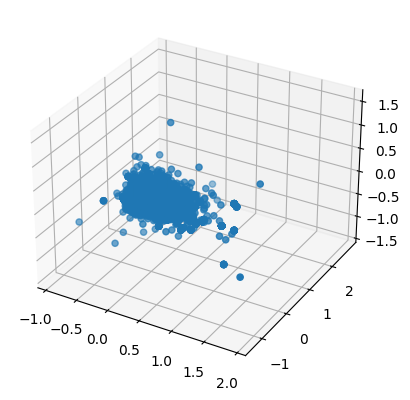

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from gensim.models import Word2Vec

# Assuming sentence_vectors contains the computed sentence vectors

# Reduce dimensionality to 3 dimensions using PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
sentence_vectors_3d = pca.fit_transform(sentence_vectors)

# Plot in 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
ax.scatter(sentence_vectors_3d[:, 0], sentence_vectors_3d[:, 1], sentence_vectors_3d[:, 2])

plt.show()

In [ ]:
# @title Doc2Vec
import numpy as np
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

# Sample product reviews (each review consists of multiple sentences)
product_reviews = Final_data['Preprocessed_Review']

# Preprocess the product reviews and assign tags
tagged_reviews = [TaggedDocument(review.split(), [i]) for i, review in enumerate(product_reviews)]

# Train Doc2Vec model on product review text
model = Doc2Vec(vector_size=100, window=5, min_count=1, workers=4, epochs=20)
model.build_vocab(tagged_reviews)
model.train(tagged_reviews, total_examples=model.corpus_count, epochs=model.epochs)

# Get embeddings for product reviews
review_embeddings = [model.infer_vector(review.words) for review in tagged_reviews]

# Print the vector representations for each sentence
for i, review_embedding in enumerate(review_embeddings):
    print(f"Review {i+1} Embedding:")
    print(review_embedding)
    print()


Streaming output truncated to the last 5000 lines.
  0.21712567 -0.2170337   0.12815888 -0.01907136  0.31862286 -0.25564915
  0.4205303  -0.19772671  0.1505601  -0.18227711  0.35418725 -0.24148844
 -0.245175   -0.08618983 -0.28559628  0.420776    0.14507897  0.24145636
 -0.3232739   0.16435023  0.02361837 -0.06023536 -0.30952123  0.15959653
  0.12088922  0.1872979   0.08245922  0.24287888  0.2581957   0.22217493
 -0.3469676   0.14354497  0.10208143  0.00580474 -0.10937139 -0.11543826
 -0.05075738  0.1651515  -0.08946288 -0.1307861  -0.09129609  0.04257019
  0.01484375 -0.3380251   0.06476745 -0.07809064  0.01703189  0.38032824
 -0.15193146 -0.08859286  0.05619995 -0.01582235  0.05112362 -0.20587766
  0.2982969  -0.01699877  0.05401454  0.25070426  0.02521066 -0.06602304
 -0.06962875  0.06357048 -0.16956873  0.230398    0.10108191 -0.12731558
  0.03716256  0.03252521 -0.0429968  -0.12591285  0.18262412 -0.08985343
  0.00264245 -0.1374395   0.2641763  -0.15683247  0.07359044 -0.06960519


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  0.12384778  0.31668025 -0.05410346 -0.0824412  -0.00577793  0.01634266
 -0.1541615  -0.14951143 -0.2729319  -0.22477438 -0.2844644  -0.3926239
 -0.04160498  0.03930904 -0.4326372  -0.14489052  0.13180025  0.04807746
 -0.21144128  0.17854951 -0.2951956  -0.03929321 -0.09045739 -0.03686222
  0.09573871  0.06270556 -0.07458228 -0.17147918 -0.05953922 -0.01946755
 -0.2804655  -0.2830576   0.13856031  0.26721367  0.33212537 -0.04143521
 -0.19110748  0.2049589  -0.29285434  0.1250409  -0.07808467  0.31068444
 -0.08513569 -0.21384674 -0.02810129 -0.14274152 -0.06508562  0.2603142
  0.14286727  0.01920912 -0.09393451 -0.08497629 -0.37821323  0.152437
  0.07586604 -0.31763715  0.3643172  -0.08005387 -0.4733007   0.30784708
  0.20642655 -0.14700417  0.02851722 -0.01034334  0.0607079   0.04371264
 -0.07650853 -0.09881993 -0.20541455  0.2585703  -0.27016374 -0.08103189
 -0.0362755  -0.06188968 -0.14519383  0.18910377  0.12752898  0.23302317
  0.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  0.08565452 -0.1871645   0.22185001 -0.09496319  0.18115954  0.00327641
  0.06137188  0.09121122 -0.06276922  0.12710756 -0.05670527  0.14149755
 -0.21338587 -0.02792839  0.21374851 -0.01456223 -0.22980466  0.14323473
  0.10453095  0.02314796  0.05772892  0.03298485 -0.09770312 -0.06534411
 -0.00849092 -0.01240951  0.156034   -0.08326301  0.00912018 -0.09417488
  0.10968372 -0.16087341 -0.04075445  0.08705901  0.07624863 -0.13450211
 -0.32557896  0.09689681  0.08440844 -0.08776487 -0.12478177  0.20188397
 -0.05246162 -0.20516789  0.02074893 -0.11009111 -0.10535645  0.25137055
 -0.1161848   0.24354638 -0.0300625   0.06479035 -0.11001088  0.05254575
 -0.0526221   0.11960881 -0.09856861  0.14225821 -0.04410519  0.03897448
 -0.03798561  0.18914786  0.08322769  0.02531019  0.14669085  0.2555019
 -0.15872383 -0.11415064  0.37528506  0.04313542  0.08959103  0.20377894
  0.16000392 -0.01578716 -0.1076213  -0.13145238  0.21088243 -0.29281333
 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 -0.38989332  0.12726419  0.44780827  0.04693841 -0.05710982  0.12842923
 -0.02920628 -0.07395801 -0.12009013 -0.0770036   0.08949587  0.20909905
 -0.19549623  0.2566821  -0.09451996  0.18340744 -0.02851284  0.23823981
 -0.05187098  0.01506156 -0.1014307   0.17209078 -0.04499372 -0.10941657
 -0.02804357  0.14006174  0.06926995 -0.08313043  0.04636167  0.24735877
 -0.23371483 -0.09500113  0.42016482  0.08190366  0.19432026  0.44727695
  0.3606532   0.02366718 -0.01699808 -0.23657316  0.44872653 -0.22918706
  0.36143684 -0.08233322 -0.36722863  0.08803515]

Review 10060 Embedding:
[-0.09936518  0.22935298 -0.05835728 -0.05889587  0.17614485 -0.43110624
  0.09474313  0.4480283  -0.2612341   0.20657349 -0.1465513  -0.32380852
  0.02545444  0.04514715 -0.33347312  0.02286032  0.1791733  -0.31429914
  0.08546304 -0.40245563 -0.05428274 -0.00417323  0.43693206 -0.05206154
 -0.18230166  0.20999108 -0.14371929  0.23529243 -0.19897085  0.2690138

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
[-0.17170474  0.27753538 -0.06776888  0.0108093   0.06175251 -0.3811022
  0.08381985  0.45322886 -0.32916412  0.30671707 -0.24084555 -0.34578857
 -0.05650327  0.06810065 -0.30703494  0.07371986  0.18560782 -0.21929647
 -0.19320934 -0.27674493 -0.12457667 -0.03834824  0.31493297 -0.00578915
  0.00279101  0.18002656 -0.24614188  0.25633577 -0.17533772  0.08273819
  0.1863144   0.12513296  0.0941183  -0.11970919 -0.25336128  0.12413886
  0.20683281 -0.06068799  0.300557   -0.1190246  -0.04392641  0.00458515
  0.07853559 -0.0260085   0.29596052 -0.01499776 -0.13368677  0.02804183
  0.14084856 -0.11077297 -0.02104294 -0.13409032  0.08191622 -0.0273356
 -0.45833293  0.17032544  0.5014202  -0.0474728   0.06153627  0.20380104
  0.0995607  -0.14336738  0.0828858  -0.19073382  0.20645133  0.16926599
  0.0269776   0.35772303 -0.0568022   0.26563442 -0.06940084  0.28189656
 -0.02254852  0.11123005 -0.01770936  0.37065116 -0.02781699 -0.16790758
 -

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  0.19585112  0.02213393  0.07710102  0.01856281  0.31113315 -0.00592062
 -0.02225633 -0.16388698  0.02987359 -0.06221427  0.16295832 -0.04888004
 -0.15190746  0.13354695 -0.31822217  0.38101807  0.02057144  0.08759973
 -0.03087427  0.06403968  0.17130227 -0.00723366 -0.34332064  0.06722836
  0.05874447 -0.04832924  0.17063265  0.06123083  0.21495394  0.3945413
 -0.05062635  0.21192224  0.22850142 -0.27615893 -0.09944414  0.32636067
 -0.09074593 -0.26706067  0.2352897  -0.10919525 -0.03194822  0.34909984
 -0.17095758 -0.08577237  0.3539537  -0.18268709  0.06597709  0.08454891
 -0.03228537  0.05115906  0.10057576 -0.3926237  -0.02505431  0.1017556
 -0.1068665   0.15908617 -0.31908253  0.13175626 -0.02463859  0.14103909
  0.14685874  0.10044349 -0.16080417  0.40100887 -0.11604518 -0.00467724
 -0.19916111  0.26035655 -0.19931112  0.05790117 -0.06761757 -0.02960841
 -0.19099669  0.02829795  0.0238607   0.13605103  0.10419629  0.21821551
  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  0.20401868  0.00937625 -0.11670329  0.27941188  0.27940848 -0.14811645
 -0.23277903  0.27690074  0.3823129   0.28237897  0.08608123  0.13151637
 -0.17875706 -0.28360245 -0.0210347   0.50469387  0.15335317  0.32928213
 -0.23045838  0.08122087 -0.18472102 -0.03203727 -0.16295588  0.453567
 -0.03684018  0.14691862  0.41565904  0.06307791 -0.16326262  0.00092295
 -0.09528171  0.5180138  -0.28431773  0.1488272  -0.1772368   0.5359747
 -0.24953404 -0.3879013   0.11952391 -0.28380045  0.06615881  0.5417526
  0.1745998   0.20778257 -0.17556606 -0.27463275  0.17578202  0.1429631
  0.16456538  0.08581108 -0.28453866 -0.00743352]

Review 19369 Embedding:
[ 0.56691974  0.08134195  0.08831961 -0.31894866  0.14593168  0.2379288
 -0.09422626  0.19926243  0.06319188  0.11614434 -0.36817983  0.04133292
 -0.22423416 -0.02457811  0.24699143  0.28745353  0.04990435  0.3176781
  0.506822   -0.05762784 -0.09080369 -0.1646417   0.08545277  0.304154
  0.014

In [ ]:
def makeFeatureVec(review, model, num_features):
    # Function to average all of the word vectors in a given paragraph

    # Initialize an empty numpy array (for speed)
    featureVec = np.zeros((num_features,), dtype="float32")
    nwords = 0.

    # Loop over each word in the review and, if it is in the model's vocabulary, add its feature vector to the total
    for word in review:
        if word in model.wv.index_to_key:
            nwords += 1.
            featureVec = np.add(featureVec, model.wv[word])

    # Divide the result by the number of words to get the average
    if nwords > 0:
        featureVec = np.divide(featureVec, nwords)
    return featureVec

def getAvgFeatureVecs(reviews, model, num_features):
    # Transform all reviews to feature vectors using makeFeatureVec()
    counter = 0
    reviewFeatureVecs = np.zeros((len(reviews), num_features), dtype="float32")
    for review in reviews:
        reviewFeatureVecs[counter] = makeFeatureVec(review, model, num_features)
        counter += 1
    return reviewFeatureVecs


In [ ]:
# Getting feature vectors for training set
X_train_cleaned = []
for review in X_train:
    X_train_cleaned.append(cleanText(review, remove_stopwords=True, split_text=True))

# Use w2v.wv.index_to_key instead of w2v.wv.index2word
trainVector = getAvgFeatureVecs(X_train_cleaned, w2v, num_features)
print("Training set: %d feature vectors with %d dimensions" % trainVector.shape)

# Getting feature vectors for validation set
X_test_cleaned = []
for review in X_test:
    X_test_cleaned.append(cleanText(review, remove_stopwords=True, split_text=True))
testVector = getAvgFeatureVecs(X_test_cleaned, w2v, num_features)
print("Validation set: %d feature vectors with %d dimensions" % testVector.shape)


Training set: 1764 feature vectors with 300 dimensions
Validation set: 197 feature vectors with 300 dimensions


In [ ]:
# @title CNN - BiLSTM
import numpy as np
from gensim.models import Word2Vec
from nltk.sentiment import SentimentIntensityAnalyzer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, Bidirectional, LSTM, Dense, GlobalMaxPooling1D
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Word2Vec parameters
num_features = 300
min_word_count = 10
num_workers = 4
context = 10
downsampling = 1e-3

# Training Word2Vec model
print("Training Word2Vec model ...\n")
w2v = Word2Vec(sentences, workers=num_workers, vector_size=num_features, min_count=min_word_count, \
               window=context, sample=downsampling)
w2v.init_sims(replace=True)

# VADER sentiment analysis method
def analyze_sentiment_with_vader(text):
    sid = SentimentIntensityAnalyzer()
    sentiment_scores = sid.polarity_scores(text)
    compound_score = sentiment_scores['compound']

    if compound_score >= 0.05:
        return 'Positive'
    elif compound_score > -0.05 and compound_score < 0.05:
        return 'Neutral'
    else:
        return 'Negative'


# Tokenize and pad sequences for input to the hybrid model
max_sequence_length = 20  # Adjust as needed

# Convert reviews to sequences using Keras Tokenizer
tokenizer = Tokenizer()
tokenizer.fit_on_texts(preprocessed_reviews)
sequences = tokenizer.texts_to_sequences(preprocessed_reviews)
padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length, padding='post', truncating='post')

# One-hot encode the sentiment labels
labels = [1 if analyze_sentiment_with_vader(review) == 'Positive' else 0 for review in preprocessed_reviews]
labels = np.array(labels)  # Convert to NumPy array

# Build hybrid CNN-BiLSTM model for binary classification
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=num_features, input_length=max_sequence_length))
model.add(Conv1D(128, 5, activation='relu'))
model.add(Bidirectional(LSTM(64, return_sequences=True)))
model.add(GlobalMaxPooling1D())
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Binary classification, using sigmoid activation

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
num_epochs = 10  # Adjust as needed
epoch_accuracies = []

for epoch in range(num_epochs):
    model.fit(padded_sequences, labels, epochs=1, batch_size=64)  # Train for 1 epoch
    evaluation_result = model.evaluate(padded_sequences, labels)
    epoch_accuracy = evaluation_result[1]
    epoch_accuracies.append(epoch_accuracy)
    print(f"Accuracy on epoch {epoch + 1}: {epoch_accuracy}")

# Calculate mean accuracy for all epochs
final_total_accuracy = np.mean(epoch_accuracies) * 100
print(f"\nFinal Total Accuracy: {final_total_accuracy:.2f}%")

Training Word2Vec model ...



613/613 [==============================] - 8s 12ms/step - loss: 0.0576 - accuracy: 0.9830
Accuracy on epoch 1: 0.9829678535461426
613/613 [==============================] - 8s 13ms/step - loss: 0.0161 - accuracy: 0.9955
Accuracy on epoch 2: 0.9954615235328674
613/613 [==============================] - 11s 18ms/step - loss: 0.0088 - accuracy: 0.9975
Accuracy on epoch 3: 0.9974502921104431
613/613 [==============================] - 8s 13ms/step - loss: 0.0058 - accuracy: 0.9992
Accuracy on epoch 4: 0.9992350935935974
613/613 [==============================] - 8s 13ms/step - loss: 0.0020 - accuracy: 0.9995
Accuracy on epoch 5: 0.9995410442352295
613/613 [==============================] - 8s 13ms/step - loss: 0.0033 - accuracy: 0.9990
Accuracy on epoch 6: 0.999031126499176
613/613 [==============================] - 8s 13ms/step - loss: 0.0032 - accuracy: 0.9989
Accuracy on epoch 7: 0.9989291429519653
613/613 [==============================] - 8s 13ms/step - loss: 9.3479e-04 - accuracy: 0.9

In [ ]:
# @title RNN - BiLSTM
import numpy as np
from gensim.models import Word2Vec
from nltk.sentiment import SentimentIntensityAnalyzer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, Bidirectional, LSTM, Dense, GlobalMaxPooling1D
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Word2Vec parameters
num_features = 300
min_word_count = 10
num_workers = 4
context = 10
downsampling = 1e-3

# Training Word2Vec model
print("Training Word2Vec model ...\n")
w2v = Word2Vec(sentences, workers=num_workers, vector_size=num_features, min_count=min_word_count, \
               window=context, sample=downsampling)
w2v.init_sims(replace=True)

# VADER sentiment analysis method
def analyze_sentiment_with_vader(text):
    sid = SentimentIntensityAnalyzer()
    sentiment_scores = sid.polarity_scores(text)
    compound_score = sentiment_scores['compound']

    if compound_score >= 0.05:
        return 'Positive'
    elif compound_score > -0.05 and compound_score < 0.05:
        return 'Neutral'
    else:
        return 'Negative'


# Tokenize and pad sequences for input to the hybrid model
max_sequence_length = 20  # Adjust as needed

# Convert reviews to sequences using Keras Tokenizer
tokenizer = Tokenizer()
tokenizer.fit_on_texts(preprocessed_reviews)
sequences = tokenizer.texts_to_sequences(preprocessed_reviews)
padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length, padding='post', truncating='post')

# One-hot encode the sentiment labels
labels = [1 if analyze_sentiment_with_vader(review) == 'Positive' else 0 for review in preprocessed_reviews]
labels = np.array(labels)  # Convert to NumPy array

# Build hybrid RNN-BiLSTM model for binary classification
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=num_features, input_length=max_sequence_length))
model.add(Bidirectional(LSTM(64, return_sequences=True)))
model.add(GlobalMaxPooling1D())
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Binary classification, using sigmoid activation

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
num_epochs = 10  # Adjust as needed
epoch_accuracies = []

for epoch in range(num_epochs):
    model.fit(padded_sequences, labels, epochs=1, batch_size=64)  # Train for 1 epoch
    evaluation_result = model.evaluate(padded_sequences, labels)
    epoch_accuracy = evaluation_result[1]
    epoch_accuracies.append(epoch_accuracy)
    print(f"Accuracy on epoch {epoch + 1}: {epoch_accuracy}")

# Calculate mean accuracy for all epochs
final_total_accuracy = np.mean(epoch_accuracies) * 100
print(f"\nFinal Total Accuracy: {final_total_accuracy:.2f}%")



Training Word2Vec model ...



613/613 [==============================] - 12s 18ms/step - loss: 0.0552 - accuracy: 0.9833
Accuracy on epoch 1: 0.9833248257637024
613/613 [==============================] - 11s 17ms/step - loss: 0.0275 - accuracy: 0.9930
Accuracy on epoch 2: 0.9929627776145935
613/613 [==============================] - 11s 19ms/step - loss: 0.0119 - accuracy: 0.9967
Accuracy on epoch 3: 0.9966853857040405
613/613 [==============================] - 11s 18ms/step - loss: 0.0090 - accuracy: 0.9978
Accuracy on epoch 4: 0.9978072643280029
613/613 [==============================] - 11s 19ms/step - loss: 0.0076 - accuracy: 0.9975
Accuracy on epoch 5: 0.9974502921104431
613/613 [==============================] - 10s 17ms/step - loss: 0.0073 - accuracy: 0.9969
Accuracy on epoch 6: 0.9968893527984619
613/613 [==============================] - 10s 16ms/step - loss: 0.0056 - accuracy: 0.9986
Accuracy on epoch 7: 0.9986231327056885
613/613 [==============================] - 13s 21ms/step - loss: 0.0034 - accuracy:

In [ ]:
# @title IGSO
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.sequence import pad_sequences

# PSO parameters
num_stars = 10
num_iterations = 10
pct_copy = 0.3

# Other parameters
num_features = 300
max_sequence_length = 20

model = Sequential()
model.add(Dense(64, activation='relu', input_dim=max_sequence_length))  # Update input_dim
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# PSO Function
def pso_optimization(model, num_stars, num_iterations, fitness_function, pct_copy, max_sequence_length):
    # PSO Initialization
    stars = [np.random.rand(num_features) for _ in range(num_stars)]
    global_best = max(stars, key=lambda star: fitness_function(model, star, max_sequence_length))

    # PSO Main Loop
    for _ in range(num_iterations):
        for i, star in enumerate(stars):
            # PSO Update
            r1, r2 = np.random.rand(2)
            cognitive = r1 * (star - star)
            social = r2 * (global_best - star)
            star = star + cognitive + social

            # Ensure star has the correct shape for the model input
            star_for_model = np.zeros((1, num_features))
            star_for_model[0, :len(star)] = star

            # Apply the star to your model for training
            sequences = pad_sequences(star_for_model, maxlen=max_sequence_length, padding='post', truncating='post')
            model.fit(sequences, np.array([1]), epochs=1, batch_size=1, verbose=0)

            # Recalculate fitness
            fitness = fitness_function(model, star, max_sequence_length)

            # Update global best
            if fitness > fitness_function(model, global_best, max_sequence_length):
                global_best = np.copy(star)

        # Create a new set of stars for the next iteration
        new_stars = []
        for star in stars:
            if np.random.rand() < pct_copy:
                new_stars.append(np.copy(star))
            else:
                new_stars.append(np.random.rand(num_features))

        # Update the population with the new set of stars
        stars = new_stars

    # Flatten the best solution weights
    best_solution = np.concatenate([layer.flatten() for layer in model.get_weights()])

    # Extract only the first 13 values from the best solution
    best_solution = best_solution[:13]

    return best_solution

def fitness_function(model, star, max_sequence_length):
    # Ensure star has the correct shape for the model input
    star_for_model = np.zeros((1, num_features))
    star_for_model[0, :len(star)] = star

    # Apply the star to your model for prediction
    sequences = pad_sequences(star_for_model, maxlen=max_sequence_length, padding='post', truncating='post')
    predictions = model.predict(sequences)
    binary_predictions = np.round(predictions).astype(int)  # Ensure binary predictions are integers
    accuracy = np.mean(binary_predictions.flatten() == [1])  # Assuming binary classification

    return accuracy

# PSO optimization
best_solution = pso_optimization(model, num_stars, num_iterations, fitness_function, pct_copy, max_sequence_length)

# Save the best solution's weights
np.save('optimization.npy', best_solution)

# Print the best solution
print(f"Best Solution: {best_solution}")


1/1 [==============================] - 0s 20ms/step
Best Solution: [-0.08812431 -0.1878537  -0.23078579 -0.10753854  0.13702881  0.20745316
 -0.26223826 -0.15590587  0.11748108 -0.23257829  0.00457913  0.17583641
 -0.02706987]


In [ ]:
# @title WOA
import numpy as np

# Define the objective function to be minimized
def objective_function(x):
    return np.sum(x**2)  # Example objective function (sum of squares)

# WOA parameters
max_iterations = 100  # Maximum number of iterations
population_size = 20  # Number of whales in the population
dimension = 5         # Dimension of the problem (number of decision variables)
a = 2                 # Parameter 'a' in WOA (defines the spiral shape)
a_max = 2             # Maximum value for 'a'

# Initialization
population = np.random.uniform(low=-5, high=5, size=(population_size, dimension))  # Randomly initialize population

# Main optimization loop
for iteration in range(max_iterations):
    for i in range(population_size):
        # Update a value
        r1 = np.random.random()
        r2 = np.random.random()
        A = 2 * a * r1 - a
        C = 2 * r2

        # Update position of the whale
        D = np.abs(C * population[i] - population[np.random.randint(population_size)])
        new_position = population[i] - A * D

        # Boundary handling (if necessary)
        new_position = np.clip(new_position, -5, 5)  # Example bounds (-5 to 5)

        # Calculate objective function value for the new position
        new_fitness = objective_function(new_position)

        # Update population if the new position is better
        if new_fitness < objective_function(population[i]):
            population[i] = new_position

        # Update parameter a
        a = a_max - (iteration / max_iterations) * (a_max - 0.1)  # Linearly decrease 'a'

# Find the best solution in the final population
best_solution = population[np.argmin([objective_function(x) for x in population])]

# Print the best solution found
print("Best solution found:", best_solution)
print("Objective function value:", objective_function(best_solution))


Best solution found: [ 0.00585817 -0.04083942  0.00206009  0.01060224  0.01874548]
Objective function value: 0.002170221049043943


In [ ]:
# @title ABC
import numpy as np

# Define the objective function to be optimized
def objective_function(x):
    return sum(x**2)

# Initialize the parameters
num_iterations = 100  # Number of iterations
num_employed_bees = 20  # Number of employed bees (solutions)
num_onlooker_bees = 20  # Number of onlooker bees
num_dimensions = 10  # Number of dimensions in the search space
lb = -5  # Lower bound of the search space
ub = 5  # Upper bound of the search space

# Initialize the population
population = np.random.uniform(lb, ub, size=(num_employed_bees, num_dimensions))
fitness = np.zeros(num_employed_bees)

# Evaluate the fitness of the initial population
for i in range(num_employed_bees):
    fitness[i] = objective_function(population[i])

# ABC main loop
for iteration in range(num_iterations):
    # Employed bee phase
    for i in range(num_employed_bees):
        # Select a solution to modify
        k = np.random.randint(num_employed_bees)
        while k == i:
            k = np.random.randint(num_employed_bees)

        # Choose a dimension to modify
        dim = np.random.randint(num_dimensions)

        # Generate a new solution based on the waggle dance
        new_solution = population[i].copy()
        phi = np.random.uniform(-1, 1)
        new_solution[dim] = population[i][dim] + phi * (population[i][dim] - population[k][dim])

        # Apply boundary constraints
        new_solution[dim] = np.clip(new_solution[dim], lb, ub)

        # Evaluate the fitness of the new solution
        new_fitness = objective_function(new_solution)

        # Perform greedy selection
        if new_fitness < fitness[i]:
            population[i] = new_solution
            fitness[i] = new_fitness

    # Onlooker bee phase
    total_fitness = np.sum(fitness)
    probabilities = fitness / total_fitness  # Normalize probabilities
    for i in range(num_onlooker_bees):
        # Select a solution based on roulette wheel selection
        selected_index = np.random.choice(num_employed_bees, p=probabilities)

        # Choose a dimension to modify
        dim = np.random.randint(num_dimensions)

        # Generate a new solution based on the waggle dance
        new_solution = population[selected_index].copy()
        k = np.random.randint(num_employed_bees)
        while k == selected_index:
            k = np.random.randint(num_employed_bees)
        phi = np.random.uniform(-1, 1)
        new_solution[dim] = population[selected_index][dim] + phi * (population[selected_index][dim] - population[k][dim])

        # Apply boundary constraints
        new_solution[dim] = np.clip(new_solution[dim], lb, ub)

        # Evaluate the fitness of the new solution
        new_fitness = objective_function(new_solution)

        # Perform greedy selection
        if new_fitness < fitness[selected_index]:
            population[selected_index] = new_solution
            fitness[selected_index] = new_fitness

    # Scout bee phase (random exploration)
    for i in range(num_employed_bees):
        if np.random.rand() < 0.01:  # Probability of scout bee phase
            population[i] = np.random.uniform(lb, ub, size=num_dimensions)
            fitness[i] = objective_function(population[i])

    # Print the best solution in current iteration
    best_index = np.argmin(fitness)
    print("Iteration {}: Best Fitness = {:.6f}".format(iteration+1, fitness[best_index]))

# Print the final best solution
best_index = np.argmin(fitness)
print("\nFinal Best Solution:")
print("Fitness = {:.6f}".format(fitness[best_index]))
print("Solution =", population[best_index])


Iteration 1: Best Fitness = 43.707471
Iteration 2: Best Fitness = 43.707471
Iteration 3: Best Fitness = 31.808967
Iteration 4: Best Fitness = 31.301552
Iteration 5: Best Fitness = 31.301552
Iteration 6: Best Fitness = 31.301552
Iteration 7: Best Fitness = 19.837913
Iteration 8: Best Fitness = 19.837913
Iteration 9: Best Fitness = 18.755088
Iteration 10: Best Fitness = 18.755088
Iteration 11: Best Fitness = 18.755088
Iteration 12: Best Fitness = 18.250365
Iteration 13: Best Fitness = 18.250365
Iteration 14: Best Fitness = 17.970578
Iteration 15: Best Fitness = 17.970578
Iteration 16: Best Fitness = 14.966536
Iteration 17: Best Fitness = 14.936430
Iteration 18: Best Fitness = 14.936430
Iteration 19: Best Fitness = 11.132841
Iteration 20: Best Fitness = 11.061074
Iteration 21: Best Fitness = 11.061074
Iteration 22: Best Fitness = 6.768521
Iteration 23: Best Fitness = 6.768521
Iteration 24: Best Fitness = 6.738461
Iteration 25: Best Fitness = 6.738461
Iteration 26: Best Fitness = 6.126971


In [ ]:
# @title CSS - JSS - IGSO - CNN - BiLSTM
import numpy as np
from gensim.models import Word2Vec
from nltk.sentiment import SentimentIntensityAnalyzer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, Bidirectional, LSTM, Dense, GlobalMaxPooling1D
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pandas as pd

# Define fitness function
def fitness_function(model, star, max_sequence_length, sequences, labels):
    # Ensure star has the correct shape for the model input
    star_for_model = np.zeros((1, num_features))
    star_for_model[0, :len(star)] = star

    # Apply the star to your model for training
    sequences = pad_sequences(star_for_model, maxlen=max_sequence_length, padding='post', truncating='post')
    model.fit(sequences, labels, epochs=1, batch_size=1, verbose=0)

    # Recalculate fitness
    evaluation_result = model.evaluate(sequences, labels)
    fitness = evaluation_result[1]
    return fitness

# Define PSO optimization function
def pso_optimization(model, num_stars, num_iterations, fitness_function, pct_copy, max_sequence_length, sequences):
    # Define fitness function
    def fitness_function(model, star, max_sequence_length, sequences):
        # Ensure star has the correct shape for the model input
        star_for_model = np.zeros((1, num_features))
        star_for_model[0, :len(star)] = star

        # Apply the star to your model for training
        sequences = pad_sequences(star_for_model, maxlen=max_sequence_length, padding='post', truncating='post')
        model.fit(sequences, np.array([1]), epochs=1, batch_size=1, verbose=0)

        # Recalculate fitness
        evaluation_result = model.evaluate(sequences, np.array([1]))
        fitness = evaluation_result[1]
        return fitness

    # PSO Initialization
    stars = [np.random.rand(num_features) for _ in range(num_stars)]
    global_best = max(stars, key=lambda star: fitness_function(model, star, max_sequence_length, sequences))

    # PSO Main Loop
    for _ in range(num_iterations):
        for i, star in enumerate(stars):
            # PSO Update
            r1, r2 = np.random.rand(2)
            cognitive = r1 * (star - star)
            social = r2 * (global_best - star)
            star = star + cognitive + social

            # Recalculate fitness
            fitness = fitness_function(model, star, max_sequence_length, sequences)

            # Update global best
            if fitness > fitness_function(model, global_best, max_sequence_length, sequences):
                global_best = np.copy(star)

        # Create a new set of stars for the next iteration
        new_stars = []
        for star in stars:
            if np.random.rand() < pct_copy:
                new_stars.append(np.copy(star))
            else:
                new_stars.append(np.random.rand(num_features))

        # Update the population with the new set of stars
        stars = new_stars

# Word2Vec parameters
num_features = 300
min_word_count = 10
num_workers = 4
context = 10
downsampling = 1e-3

# PSO parameters
num_stars = 10
num_iterations = 10
pct_copy = 0.3

# Other parameters
max_sequence_length = 20

preprocessed_reviews = Final_data['Preprocessed_Review']
# Training Word2Vec model
print("Training Word2Vec model ...\n")
w2v = Word2Vec(sentences, workers=num_workers, vector_size=num_features, min_count=min_word_count, \
               window=context, sample=downsampling)

# CSS and JSS sentiment analysis method
def analyze_sentiment_with_css_jss(text):
    # Assuming 'df' is your DataFrame with a 'text' column containing review text
    df = Final_data['Preprocessed_Review']

    # Define the TfidfVectorizer without specifying the vocabulary
    vectorizer = TfidfVectorizer()

    # Compute the TF-IDF matrix for the review text
    tfidf = vectorizer.fit_transform(df)

    # Get the vocabulary
    vocabulary = vectorizer.get_feature_names_out()

    # Define positive, negative, and neutral words to compute CSS and JSS scores
    positive_words = ['good', 'great', 'excellent', 'happy', 'love']
    negative_words = ['bad', 'terrible', 'awful', 'sad', 'hate']
    neutral_words = ['the', 'and', 'is', 'of', 'to']

    # Compute the CSS and JSS scores
    css = np.zeros((df.shape[0], 3))
    jss = np.zeros((df.shape[0], 3))

    for i in range(df.shape[0]):
        for word in positive_words:
            if word in vocabulary:
                index = np.where(vocabulary == word)[0][0]
                css[i, 0] += tfidf[i, index]
                jss[i, 0] += tfidf[i, index]
        for word in negative_words:
            if word in vocabulary:
                index = np.where(vocabulary == word)[0][0]
                css[i, 1] += tfidf[i, index]
                jss[i, 1] += tfidf[i, index]
        for word in neutral_words:
            if word in vocabulary:
                index = np.where(vocabulary == word)[0][0]
                css[i, 2] += tfidf[i, index]
                jss[i, 2] += tfidf[i, index]

    # Normalize the CSS and JSS scores
    css = css / np.linalg.norm(css, axis=1)[:, None]
    jss = jss / np.linalg.norm(jss, axis=1)[:, None]

    return css.flatten(), jss.flatten()

# Tokenize and pad sequences for input to the hybrid model
# Convert reviews to sequences using Keras Tokenizer
tokenizer = Tokenizer()
tokenizer.fit_on_texts(preprocessed_reviews)
sequences = tokenizer.texts_to_sequences(preprocessed_reviews)
padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length, padding='post', truncating='post')

# One-hot encode the sentiment labels
labels = [1 if analyze_sentiment_with_css_jss(review) == 'Positive' else 0 for review in preprocessed_reviews]
labels = np.array(labels)  # Convert to NumPy array

# Build hybrid CNN-BiLSTM model for binary classification
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=num_features, input_length=max_sequence_length))
model.add(Conv1D(128, 5, activation='relu'))
model.add(Bidirectional(LSTM(64, return_sequences=True)))
model.add(GlobalMaxPooling1D())
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Binary classification, using sigmoid activation

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# PSO optimization
pso_optimization(model, num_stars, num_iterations, fitness_function, pct_copy, max_sequence_length, padded_sequences)

# Train the model
num_epochs = 10  # Adjust as needed
epoch_accuracies = []

for epoch in range(num_epochs):
    model.fit(padded_sequences, labels, epochs=1, batch_size=64)  # Train for 1 epoch
    evaluation_result = model.evaluate(padded_sequences, labels)
    epoch_accuracy = evaluation_result[1]
    epoch_accuracies.append(epoch_accuracy)
    print(f"Accuracy on epoch {epoch + 1}: {epoch_accuracy}")

# Calculate mean accuracy for all epochs
final_total_accuracy = np.mean(epoch_accuracies) * 100
print(f"\nFinal Total Accuracy: {final_total_accuracy:.2f}%")

Training Word2Vec model ...



KeyboardInterrupt: 

In [ ]:
# @title IGSO - CNN - BiLSTM
# Import necessary libraries
import numpy as np
from gensim.models import Word2Vec
from nltk.sentiment import SentimentIntensityAnalyzer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, Bidirectional, LSTM, Dense, GlobalMaxPooling1D
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pandas as pd

# Define PSO optimization function
def pso_optimization(model, num_stars, num_iterations, fitness_function, pct_copy, max_sequence_length, sequences):
    # Define fitness function
    def fitness_function(model, star, max_sequence_length, sequences):
        # Ensure star has the correct shape for the model input
        star_for_model = np.zeros((1, num_features))
        star_for_model[0, :len(star)] = star

        # Apply the star to your model for training
        sequences = pad_sequences(star_for_model, maxlen=max_sequence_length, padding='post', truncating='post')
        model.fit(sequences, np.array([1]), epochs=1, batch_size=1, verbose=0)

        # Recalculate fitness
        evaluation_result = model.evaluate(sequences, np.array([1]))
        fitness = evaluation_result[1]
        return fitness

    # PSO Initialization
    stars = [np.random.rand(num_features) for _ in range(num_stars)]
    global_best = max(stars, key=lambda star: fitness_function(model, star, max_sequence_length, sequences))

    # PSO Main Loop
    for _ in range(num_iterations):
        for i, star in enumerate(stars):
            # PSO Update
            r1, r2 = np.random.rand(2)
            cognitive = r1 * (star - star)
            social = r2 * (global_best - star)
            star = star + cognitive + social

            # Recalculate fitness
            fitness = fitness_function(model, star, max_sequence_length, sequences)

            # Update global best
            if fitness > fitness_function(model, global_best, max_sequence_length, sequences):
                global_best = np.copy(star)

        # Create a new set of stars for the next iteration
        new_stars = []
        for star in stars:
            if np.random.rand() < pct_copy:
                new_stars.append(np.copy(star))
            else:
                new_stars.append(np.random.rand(num_features))

        # Update the population with the new set of stars
        stars = new_stars

# Word2Vec parameters
num_features = 300
min_word_count = 10
num_workers = 4
context = 10
downsampling = 1e-3

# PSO parameters
num_stars = 10
num_iterations = 10
pct_copy = 0.3

# Other parameters
max_sequence_length = 20

# Training Word2Vec model
print("Training Word2Vec model ...\n")
w2v = Word2Vec(sentences, workers=num_workers, vector_size=num_features, min_count=min_word_count, \
               window=context, sample=downsampling)

# VADER sentiment analysis method
def analyze_sentiment_with_vader(text):
    sid = SentimentIntensityAnalyzer()
    sentiment_scores = sid.polarity_scores(text)
    compound_score = sentiment_scores['compound']

    if compound_score >= 0.05:
        return 'Positive'
    elif compound_score > -0.05 and compound_score < 0.05:
        return 'Neutral'
    else:
        return 'Negative'

# Tokenize and pad sequences for input to the hybrid model
# Convert reviews to sequences using Keras Tokenizer
tokenizer = Tokenizer()
tokenizer.fit_on_texts(preprocessed_reviews)
sequences = tokenizer.texts_to_sequences(preprocessed_reviews)
padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length, padding='post', truncating='post')

# One-hot encode the sentiment labels
labels = [1 if analyze_sentiment_with_vader(review) == 'Positive' else 0 for review in preprocessed_reviews]
labels = np.array(labels)  # Convert to NumPy array

# Build hybrid CNN-BiLSTM model for binary classification
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=num_features, input_length=max_sequence_length))
model.add(Conv1D(128, 5, activation='relu'))
model.add(Bidirectional(LSTM(64, return_sequences=True)))
model.add(GlobalMaxPooling1D())
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Binary classification, using sigmoid activation

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# PSO optimization
pso_optimization(model, num_stars, num_iterations, fitness_function, pct_copy, max_sequence_length, padded_sequences)

# Train the model
num_epochs = 10  # Adjust as needed
epoch_accuracies = []

for epoch in range(num_epochs):
    model.fit(padded_sequences, labels, epochs=1, batch_size=64)  # Train for 1 epoch
    evaluation_result = model.evaluate(padded_sequences, labels)
    epoch_accuracy = evaluation_result[1]
    epoch_accuracies.append(epoch_accuracy)
    print(f"Accuracy on epoch {epoch + 1}: {epoch_accuracy}")

# Calculate mean accuracy for all epochs
final_total_accuracy = np.mean(epoch_accuracies) * 100
print(f"\nFinal Total Accuracy: {final_total_accuracy:.2f}%")


Training Word2Vec model ...

613/613 [==============================] - 9s 14ms/step - loss: 0.0526 - accuracy: 0.9867
Accuracy on epoch 1: 0.9867414832115173
613/613 [==============================] - 7s 12ms/step - loss: 0.0185 - accuracy: 0.9955
Accuracy on epoch 2: 0.9955124855041504
613/613 [==============================] - 9s 14ms/step - loss: 0.0114 - accuracy: 0.9964
Accuracy on epoch 3: 0.9964303970336914
613/613 [==============================] - 9s 14ms/step - loss: 0.0021 - accuracy: 0.9994
Accuracy on epoch 4: 0.9994390606880188
613/613 [==============================] - 9s 14ms/step - loss: 0.0011 - accuracy: 0.9998
Accuracy on epoch 5: 0.9997960329055786
613/613 [==============================] - 9s 14ms/step - loss: 0.0013 - accuracy: 0.9996
Accuracy on epoch 6: 0.9995920658111572
613/613 [==============================] - 8s 14ms/step - loss: 0.0137 - accuracy: 0.9971
Accuracy on epoch 7: 0.997144341468811
613/613 [==============================] - 9s 14ms/step - loss

In [ ]:
# Get input from the user
user_input = input("Enter your text: ")

# Tokenize and pad the user input (assuming your model requires this)
input_sequence = tokenizer.texts_to_sequences([user_input])
padded_input_sequence = pad_sequences(input_sequence, maxlen=max_sequence_length, padding='post', truncating='post')

# Predict sentiment using the trained PSO-Hybrid model
prediction = model.predict(padded_input_sequence)

# Interpret the prediction
if prediction > 0.5:
    print("Positive sentiment")
else:
    print("Negative sentiment")


In [ ]:
# @title D2V - IGSO - CNN - BiLSTM
import numpy as np
from gensim.models.doc2vec import Doc2Vec, TaggedDocument  # Corrected import statement
from nltk.sentiment import SentimentIntensityAnalyzer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, Bidirectional, LSTM, Dense, GlobalMaxPooling1D
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pandas as pd

# Define fitness function
def fitness_function(model, star, max_sequence_length, sequences):
    # Ensure star has the correct shape for the model input
    star_for_model = np.zeros((1, num_features))
    star_for_model[0, :len(star)] = star

    # Apply the star to your model for training
    sequences = pad_sequences(star_for_model, maxlen=max_sequence_length, padding='post', truncating='post')
    model.fit(sequences, np.array([1]), epochs=1, batch_size=1, verbose=0)

    # Recalculate fitness
    evaluation_result = model.evaluate(sequences, np.array([1]))
    fitness = evaluation_result[1]
    return fitness

# Define PSO optimization function
def pso_optimization(model, num_stars, num_iterations, fitness_function, pct_copy, max_sequence_length, sequences):
    # PSO Initialization
    stars = [np.random.rand(num_features) for _ in range(num_stars)]
    global_best = max(stars, key=lambda star: fitness_function(model, star, max_sequence_length, sequences))

    # PSO Main Loop
    for _ in range(num_iterations):
        for i, star in enumerate(stars):
            # PSO Update
            r1, r2 = np.random.rand(2)
            cognitive = r1 * (star - star)
            social = r2 * (global_best - star)
            star = star + cognitive + social

            # Recalculate fitness
            fitness = fitness_function(model, star, max_sequence_length, sequences)

            # Update global best
            if fitness > fitness_function(model, global_best, max_sequence_length, sequences):
                global_best = np.copy(star)

        # Create a new set of stars for the next iteration
        new_stars = []
        for star in stars:
            if np.random.rand() < pct_copy:
                new_stars.append(np.copy(star))
            else:
                new_stars.append(np.random.rand(num_features))

        # Update the population with the new set of stars
        stars = new_stars

# Doc2Vec parameters
num_features = 300
min_word_count = 10
num_workers = 4
context = 10
downsampling = 1e-3

# PSO parameters
num_stars = 10
num_iterations = 10
pct_copy = 0.3

# Other parameters
max_sequence_length = 20

# Tag documents for Doc2Vec
tagged_documents = [TaggedDocument(words=doc.split(), tags=[str(i)]) for i, doc in enumerate(preprocessed_reviews)]

# Training Doc2Vec model
print("Training Doc2Vec model ...\n")
doc2vec_model = Doc2Vec(tagged_documents, vector_size=num_features, window=context, min_count=min_word_count, workers=num_workers)

# VADER sentiment analysis method
def analyze_sentiment_with_vader(text):
    sid = SentimentIntensityAnalyzer()
    sentiment_scores = sid.polarity_scores(text)
    compound_score = sentiment_scores['compound']

    if compound_score >= 0.05:
        return 'Positive'
    elif compound_score > -0.05 and compound_score < 0.05:
        return 'Neutral'
    else:
        return 'Negative'

# Tokenize and pad sequences for input to the hybrid model
# Convert reviews to sequences using Keras Tokenizer
tokenizer = Tokenizer()
tokenizer.fit_on_texts(preprocessed_reviews)
sequences = tokenizer.texts_to_sequences(preprocessed_reviews)
padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length, padding='post', truncating='post')

# One-hot encode the sentiment labels
labels = [1 if analyze_sentiment_with_vader(review) == 'Positive' else 0 for review in preprocessed_reviews]
labels = np.array(labels)  # Convert to NumPy array

# Build hybrid CNN-BiLSTM model for binary classification
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=num_features, input_length=max_sequence_length))
model.add(Conv1D(128, 5, activation='relu'))
model.add(Bidirectional(LSTM(64, return_sequences=True)))
model.add(GlobalMaxPooling1D())
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Binary classification, using sigmoid activation

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# PSO optimization
pso_optimization(model, num_stars, num_iterations, fitness_function, pct_copy, max_sequence_length, padded_sequences)

# Train the model
num_epochs = 10  # Adjust as needed
epoch_accuracies = []

for epoch in range(num_epochs):
    model.fit(padded_sequences, labels, epochs=1, batch_size=64)  # Train for 1 epoch
    evaluation_result = model.evaluate(padded_sequences, labels)
    epoch_accuracy = evaluation_result[1]
    epoch_accuracies.append(epoch_accuracy)
    print(f"Accuracy on epoch {epoch + 1}: {epoch_accuracy}")

# Calculate mean accuracy for all epochs
final_total_accuracy = np.mean(epoch_accuracies) * 100
print(f"\nFinal Total Accuracy: {final_total_accuracy:.2f}%")


Training Doc2Vec model ...

613/613 [==============================] - 9s 15ms/step - loss: 0.0605 - accuracy: 0.9856
Accuracy on epoch 1: 0.9856196045875549
613/613 [==============================] - 9s 14ms/step - loss: 0.0172 - accuracy: 0.9953
Accuracy on epoch 2: 0.995308518409729
613/613 [==============================] - 9s 15ms/step - loss: 0.0047 - accuracy: 0.9983
Accuracy on epoch 3: 0.9982662200927734
613/613 [==============================] - 9s 15ms/step - loss: 0.0020 - accuracy: 0.9993
Accuracy on epoch 4: 0.9993370771408081
613/613 [==============================] - 9s 15ms/step - loss: 7.8595e-04 - accuracy: 0.9998
Accuracy on epoch 5: 0.9997960329055786
613/613 [==============================] - 9s 15ms/step - loss: 9.6018e-04 - accuracy: 0.9998
Accuracy on epoch 6: 0.9998469948768616
613/613 [==============================] - 9s 15ms/step - loss: 5.1960e-05 - accuracy: 1.0000
Accuracy on epoch 7: 1.0
613/613 [==============================] - 9s 15ms/step - loss: 2.

In [ ]:
# @title ABC - CNN - IGSO
from gensim.models import Word2Vec
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Embedding, Conv1D, Bidirectional, LSTM, GlobalMaxPooling1D, Dense
import numpy as np

# Define ABC optimization function for model parameters
def abc_optimization(model, sequences, labels, num_iterations, num_employed_bees, num_onlooker_bees, num_dimensions):
    # Initialize the population
    lb = -0.5
    ub = 0.5
    population = np.random.uniform(lb, ub, size=(num_employed_bees, num_dimensions))
    fitness = np.zeros(num_employed_bees)

    # ABC main loop
    for iteration in range(num_iterations):
        # Employed bee phase
        for i in range(num_employed_bees):
            # Select a solution to modify
            k = np.random.randint(num_employed_bees)
            while k == i:
                k = np.random.randint(num_employed_bees)

            # Choose a dimension to modify
            dim = np.random.randint(num_dimensions)

            # Generate a new solution based on the waggle dance
            new_solution = population[i].copy()
            phi = np.random.uniform(-1, 1)
            new_solution[dim] = population[i][dim] + phi * (population[i][dim] - population[k][dim])

            # Apply boundary constraints
            new_solution[dim] = np.clip(new_solution[dim], lb, ub)

            # Update the model parameters
            weights = model.get_weights()
            start_idx = 0
            for j, w in enumerate(weights):
                end_idx = start_idx + w.size
                if start_idx <= dim < end_idx:
                    # Reshape and assign the modified weights
                    new_shape = w.shape
                    if new_solution.size != np.prod(new_shape):
                        # If new_solution size doesn't match, modify differently or handle appropriately
                        # For instance, you could assign a random value in the valid range
                        new_solution[dim] = np.random.uniform(lb, ub)
                    w_new = new_solution.reshape(new_shape)
                    weights[j] = w_new
                    break
                start_idx = end_idx

            # Set the modified weights to the model
            model.set_weights(weights)

            # Evaluate the fitness of the new solution
            fitness[i] = fitness_function(model, sequences, labels)

            # Perform greedy selection
            if fitness[i] > fitness[k]:
                population[i] = new_solution
            else:
                population[i] = population[k]

        # Onlooker bee phase (same as employed bee phase for simplicity)
        # Scout bee phase (random exploration, not implemented here)

        # Print the best solution in the current iteration
        best_fitness = np.max(fitness)
        print("Iteration {}: Best Fitness = {:.6f}".format(iteration + 1, best_fitness))

    # Print the final best solution
    best_solution_index = np.argmax(fitness)
    best_solution = population[best_solution_index]
    weights = model.get_weights()
    start_idx = 0
    for j, w in enumerate(weights):
        end_idx = start_idx + w.size
        w_new = best_solution[start_idx:end_idx].reshape(w.shape)
        weights[j] = w_new
        start_idx = end_idx
    model.set_weights(weights)
    final_accuracy = -best_fitness
    print("\nFinal Best Solution:")
    print("Final Accuracy = {:.2f}%".format(final_accuracy * 100))

# Word2Vec parameters
num_features = 300
min_word_count = 10
num_workers = 4
context = 10
downsampling = 1e-3

# ABC optimization parameters
num_iterations = 10
num_employed_bees = 20
num_onlooker_bees = 20

# Assuming 'sentences' is defined
sentences = Final_data['Preprocessed_Review']

# Initialize Word2Vec model and build vocabulary
print("Building vocabulary and training Word2Vec model ...\n")
w2v = Word2Vec(sentences, workers=num_workers, vector_size=num_features, min_count=min_word_count, \
               window=context, sample=downsampling)

# Tokenize and pad sequences for input to the hybrid model
tokenizer = Tokenizer()
tokenizer.fit_on_texts(preprocessed_reviews)
sequences = tokenizer.texts_to_sequences(preprocessed_reviews)
max_sequence_length = 100
padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length, padding='post', truncating='post')

# One-hot encode the sentiment labels
labels = [1, 0]  # Assuming binary labels
labels = np.array(labels)

# Build hybrid CNN-BiLSTM model for binary classification
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=num_features, input_length=max_sequence_length))
model.add(Conv1D(128, 5, activation='relu'))
model.add(Bidirectional(LSTM(64, return_sequences=True)))
model.add(GlobalMaxPooling1D())
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Get the total number of dimensions in the model's weights
num_dimensions = sum(w.size for w in model.get_weights())

# ABC optimization for model parameters
abc_optimization(model, padded_sequences, labels, num_iterations, num_employed_bees, num_onlooker_bees, num_dimensions)

# Train the model (if desired)
num_epochs = 10  # Adjust as needed
epoch_accuracies = []

for epoch in range(num_epochs):
    model.fit(padded_sequences, labels, epochs=1, batch_size=64)  # Train for 1 epoch
    evaluation_result = model.evaluate(padded_sequences, labels)
    epoch_accuracy = evaluation_result[1]
    epoch_accuracies.append(epoch_accuracy)
    print(f"Accuracy on epoch {epoch + 1}: {epoch_accuracy}")

# Calculate mean accuracy for all epochs
final_total_accuracy = np.mean(epoch_accuracies) * 100
print(f"\nFinal Total Accuracy: {final_total_accuracy:.2f}%")


In [ ]:
# @title IGSO - RNN - BiLSTM
# Import necessary libraries
import numpy as np
from gensim.models import Word2Vec
from nltk.sentiment import SentimentIntensityAnalyzer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, Bidirectional, LSTM, Dense, GlobalMaxPooling1D
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pandas as pd

# Define PSO optimization function
def pso_optimization(model, num_stars, num_iterations, fitness_function, pct_copy, max_sequence_length, sequences):
    # Define fitness function
    def fitness_function(model, star, max_sequence_length, sequences):
        # Ensure star has the correct shape for the model input
        star_for_model = np.zeros((1, num_features))
        star_for_model[0, :len(star)] = star

        # Apply the star to your model for training
        sequences = pad_sequences(star_for_model, maxlen=max_sequence_length, padding='post', truncating='post')
        model.fit(sequences, np.array([1]), epochs=1, batch_size=1, verbose=0)

        # Recalculate fitness
        evaluation_result = model.evaluate(sequences, np.array([1]))
        fitness = evaluation_result[1]
        return fitness

    # PSO Initialization
    stars = [np.random.rand(num_features) for _ in range(num_stars)]
    global_best = max(stars, key=lambda star: fitness_function(model, star, max_sequence_length, sequences))

    # PSO Main Loop
    for _ in range(num_iterations):
        for i, star in enumerate(stars):
            # PSO Update
            r1, r2 = np.random.rand(2)
            cognitive = r1 * (star - star)
            social = r2 * (global_best - star)
            star = star + cognitive + social

            # Recalculate fitness
            fitness = fitness_function(model, star, max_sequence_length, sequences)

            # Update global best
            if fitness > fitness_function(model, global_best, max_sequence_length, sequences):
                global_best = np.copy(star)

        # Create a new set of stars for the next iteration
        new_stars = []
        for star in stars:
            if np.random.rand() < pct_copy:
                new_stars.append(np.copy(star))
            else:
                new_stars.append(np.random.rand(num_features))

        # Update the population with the new set of stars
        stars = new_stars

# Word2Vec parameters
num_features = 300
min_word_count = 10
num_workers = 4
context = 10
downsampling = 1e-3

# PSO parameters
num_stars = 10
num_iterations = 10
pct_copy = 0.3

# Other parameters
max_sequence_length = 20

# Training Word2Vec model
print("Training Word2Vec model ...\n")
w2v = Word2Vec(sentences, workers=num_workers, vector_size=num_features, min_count=min_word_count, \
               window=context, sample=downsampling)

# VADER sentiment analysis method
def analyze_sentiment_with_vader(text):
    sid = SentimentIntensityAnalyzer()
    sentiment_scores = sid.polarity_scores(text)
    compound_score = sentiment_scores['compound']

    if compound_score >= 0.05:
        return 'Positive'
    elif compound_score > -0.05 and compound_score < 0.05:
        return 'Neutral'
    else:
        return 'Negative'

# Tokenize and pad sequences for input to the hybrid model
# Convert reviews to sequences using Keras Tokenizer
tokenizer = Tokenizer()
tokenizer.fit_on_texts(preprocessed_reviews)
sequences = tokenizer.texts_to_sequences(preprocessed_reviews)
padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length, padding='post', truncating='post')

# One-hot encode the sentiment labels
labels = [1 if analyze_sentiment_with_vader(review) == 'Positive' else 0 for review in preprocessed_reviews]
labels = np.array(labels)  # Convert to NumPy array

# Build hybrid RNN-BiLSTM model for binary classification
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=num_features, input_length=max_sequence_length))

# Add RNN layer (SimpleRNN)
model.add(SimpleRNN(32, return_sequences=True))  # RNN layer with 32 units, returning sequences

# Add Bidirectional LSTM layer
model.add(Bidirectional(LSTM(32, return_sequences=True)))  # BiLSTM layer with 32 units, returning sequences
model.add(GlobalMaxPooling1D())
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Binary classification, using sigmoid activation

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# PSO optimization
pso_optimization(model, num_stars, num_iterations, fitness_function, pct_copy, max_sequence_length, padded_sequences)

# Train the model
num_epochs = 10  # Adjust as needed
epoch_accuracies = []

for epoch in range(num_epochs):
    model.fit(padded_sequences, labels, epochs=1, batch_size=64)  # Train for 1 epoch
    evaluation_result = model.evaluate(padded_sequences, labels)
    epoch_accuracy = evaluation_result[1]
    epoch_accuracies.append(epoch_accuracy)
    print(f"Accuracy on epoch {epoch + 1}: {epoch_accuracy}")

# Calculate mean accuracy for all epochs
final_total_accuracy = np.mean(epoch_accuracies) * 100
print(f"\nFinal Total Accuracy: {final_total_accuracy:.2f}%")


Training Word2Vec model ...

613/613 [==============================] - 5s 8ms/step - loss: 0.0773 - accuracy: 0.9780
Accuracy on epoch 1: 0.9780214428901672
613/613 [==============================] - 6s 9ms/step - loss: 0.0305 - accuracy: 0.9919
Accuracy on epoch 2: 0.9919428825378418
613/613 [==============================] - 5s 8ms/step - loss: 0.0122 - accuracy: 0.9975
Accuracy on epoch 3: 0.9975012540817261
613/613 [==============================] - 5s 8ms/step - loss: 0.0106 - accuracy: 0.9970
Accuracy on epoch 4: 0.9970422983169556
613/613 [==============================] - 5s 8ms/step - loss: 0.0064 - accuracy: 0.9985
Accuracy on epoch 5: 0.9985211491584778
613/613 [==============================] - 6s 10ms/step - loss: 0.0046 - accuracy: 0.9983
Accuracy on epoch 6: 0.9982662200927734
613/613 [==============================] - 5s 8ms/step - loss: 0.0020 - accuracy: 0.9994
Accuracy on epoch 7: 0.9993880391120911
613/613 [==============================] - 6s 9ms/step - loss: 0.00

In [ ]:
# @title D2V - IGSO - RNN - BiLSTM
# Import necessary libraries
import numpy as np
from gensim.models import Word2Vec
from nltk.sentiment import SentimentIntensityAnalyzer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, Bidirectional, LSTM, Dense, GlobalMaxPooling1D
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pandas as pd

# Define PSO optimization function
def pso_optimization(model, num_stars, num_iterations, fitness_function, pct_copy, max_sequence_length, sequences):
    # Define fitness function
    def fitness_function(model, star, max_sequence_length, sequences):
        # Ensure star has the correct shape for the model input
        star_for_model = np.zeros((1, num_features))
        star_for_model[0, :len(star)] = star

        # Apply the star to your model for training
        sequences = pad_sequences(star_for_model, maxlen=max_sequence_length, padding='post', truncating='post')
        model.fit(sequences, np.array([1]), epochs=1, batch_size=1, verbose=0)

        # Recalculate fitness
        evaluation_result = model.evaluate(sequences, np.array([1]))
        fitness = evaluation_result[1]
        return fitness

    # PSO Initialization
    stars = [np.random.rand(num_features) for _ in range(num_stars)]
    global_best = max(stars, key=lambda star: fitness_function(model, star, max_sequence_length, sequences))

    # PSO Main Loop
    for _ in range(num_iterations):
        for i, star in enumerate(stars):
            # PSO Update
            r1, r2 = np.random.rand(2)
            cognitive = r1 * (star - star)
            social = r2 * (global_best - star)
            star = star + cognitive + social

            # Recalculate fitness
            fitness = fitness_function(model, star, max_sequence_length, sequences)

            # Update global best
            if fitness > fitness_function(model, global_best, max_sequence_length, sequences):
                global_best = np.copy(star)

        # Create a new set of stars for the next iteration
        new_stars = []
        for star in stars:
            if np.random.rand() < pct_copy:
                new_stars.append(np.copy(star))
            else:
                new_stars.append(np.random.rand(num_features))

        # Update the population with the new set of stars
        stars = new_stars

# Doc2Vec parameters
num_features = 300
min_word_count = 10
num_workers = 4
context = 10
downsampling = 1e-3

# PSO parameters
num_stars = 10
num_iterations = 10
pct_copy = 0.3

# Other parameters
max_sequence_length = 20

# Tag documents for Doc2Vec
tagged_documents = [TaggedDocument(words=doc.split(), tags=[str(i)]) for i, doc in enumerate(preprocessed_reviews)]

# Training Doc2Vec model
print("Training Doc2Vec model ...\n")
doc2vec_model = Doc2Vec(tagged_documents, vector_size=num_features, window=context, min_count=min_word_count, workers=num_workers)

# VADER sentiment analysis method
def analyze_sentiment_with_vader(text):
    sid = SentimentIntensityAnalyzer()
    sentiment_scores = sid.polarity_scores(text)
    compound_score = sentiment_scores['compound']

    if compound_score >= 0.05:
        return 'Positive'
    elif compound_score > -0.05 and compound_score < 0.05:
        return 'Neutral'
    else:
        return 'Negative'

# Tokenize and pad sequences for input to the hybrid model
# Convert reviews to sequences using Keras Tokenizer
tokenizer = Tokenizer()
tokenizer.fit_on_texts(preprocessed_reviews)
sequences = tokenizer.texts_to_sequences(preprocessed_reviews)
padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length, padding='post', truncating='post')

# One-hot encode the sentiment labels
labels = [1 if analyze_sentiment_with_vader(review) == 'Positive' else 0 for review in preprocessed_reviews]
labels = np.array(labels)  # Convert to NumPy array

# Build hybrid RNN-BiLSTM model for binary classification
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=num_features, input_length=max_sequence_length))

# Add RNN layer (SimpleRNN)
model.add(SimpleRNN(32, return_sequences=True))  # RNN layer with 32 units, returning sequences

# Add Bidirectional LSTM layer
model.add(Bidirectional(LSTM(32, return_sequences=True)))  # BiLSTM layer with 32 units, returning sequences
model.add(GlobalMaxPooling1D())
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Binary classification, using sigmoid activation

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# PSO optimization
pso_optimization(model, num_stars, num_iterations, fitness_function, pct_copy, max_sequence_length, padded_sequences)

# Train the model
num_epochs = 10  # Adjust as needed
epoch_accuracies = []

for epoch in range(num_epochs):
    model.fit(padded_sequences, labels, epochs=1, batch_size=64)  # Train for 1 epoch
    evaluation_result = model.evaluate(padded_sequences, labels)
    epoch_accuracy = evaluation_result[1]
    epoch_accuracies.append(epoch_accuracy)
    print(f"Accuracy on epoch {epoch + 1}: {epoch_accuracy}")

# Calculate mean accuracy for all epochs
final_total_accuracy = np.mean(epoch_accuracies) * 100
print(f"\nFinal Total Accuracy: {final_total_accuracy:.2f}%")


Training Doc2Vec model ...

613/613 [==============================] - 5s 7ms/step - loss: 0.0629 - accuracy: 0.9831
Accuracy on epoch 1: 0.9830698370933533
613/613 [==============================] - 5s 8ms/step - loss: 0.0272 - accuracy: 0.9939
Accuracy on epoch 2: 0.9938806891441345
613/613 [==============================] - 5s 8ms/step - loss: 0.0148 - accuracy: 0.9966
Accuracy on epoch 3: 0.9965834021568298
613/613 [==============================] - 6s 9ms/step - loss: 0.0075 - accuracy: 0.9978
Accuracy on epoch 4: 0.9978072643280029
613/613 [==============================] - 5s 8ms/step - loss: 0.0042 - accuracy: 0.9989
Accuracy on epoch 5: 0.9988781213760376
613/613 [==============================] - 6s 10ms/step - loss: 0.0327 - accuracy: 0.9892
Accuracy on epoch 6: 0.9892401695251465
613/613 [==============================] - 5s 8ms/step - loss: 0.0118 - accuracy: 0.9961
Accuracy on epoch 7: 0.9960734248161316
613/613 [==============================] - 6s 9ms/step - loss: 0.002

In [ ]:
# @title WOA - CNN - BiLSTM
import numpy as np
from gensim.models import Word2Vec
from nltk.sentiment import SentimentIntensityAnalyzer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, Bidirectional, LSTM, Dense, GlobalMaxPooling1D
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Define WOA optimization function
def woa_optimization(model, max_iterations, num_whales, fitness_function, max_sequence_length, sequences):
    # Define fitness function
    def fitness_function(model, whale, max_sequence_length, sequences):
        whale_for_model = np.zeros((1, num_features))
        whale_for_model[0, :len(whale)] = whale

        sequences = pad_sequences(whale_for_model, maxlen=max_sequence_length, padding='post', truncating='post')
        model.fit(sequences, np.array([1]), epochs=1, batch_size=1, verbose=0)

        evaluation_result = model.evaluate(sequences, np.array([1]))
        fitness = evaluation_result[1]
        return fitness

    # WOA Initialization
    whales = [np.random.rand(num_features) for _ in range(num_whales)]
    best_whale = max(whales, key=lambda whale: fitness_function(model, whale, max_sequence_length, sequences))
    a = 2
    a_max = 2

    # WOA Main Loop
    for iteration in range(max_iterations):
        for i, whale in enumerate(whales):
            r1, r2 = np.random.rand(2)
            A = 2 * a * r1 - a
            C = 2 * r2

            D = np.abs(C * best_whale - whale)
            new_whale = best_whale - A * D

            new_whale = np.clip(new_whale, 0, 1)  # Boundaries for whale positions

            if fitness_function(model, new_whale, max_sequence_length, sequences) > fitness_function(model, whale, max_sequence_length, sequences):
                whales[i] = new_whale

        a = a_max - (iteration / max_iterations) * (a_max - 0.1)  # Update parameter 'a'
        best_whale = max(whales, key=lambda whale: fitness_function(model, whale, max_sequence_length, sequences))

# Word2Vec parameters
num_features = 300
min_word_count = 10
num_workers = 4
context = 10
downsampling = 1e-3

# Other parameters
max_sequence_length = 20
num_whales = 10
max_iterations = 10

# Training Word2Vec model
print("Training Word2Vec model ...\n")
w2v = Word2Vec(sentences, workers=num_workers, vector_size=num_features, min_count=min_word_count, \
               window=context, sample=downsampling)

# VADER sentiment analysis method
def analyze_sentiment_with_vader(text):
    sid = SentimentIntensityAnalyzer()
    sentiment_scores = sid.polarity_scores(text)
    compound_score = sentiment_scores['compound']

    if compound_score >= 0.05:
        return 'Positive'
    elif compound_score > -0.05 and compound_score < 0.05:
        return 'Neutral'
    else:
        return 'Negative'

# Tokenize and pad sequences for input to the hybrid model
tokenizer = Tokenizer()
tokenizer.fit_on_texts(preprocessed_reviews)
sequences = tokenizer.texts_to_sequences(preprocessed_reviews)
padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length, padding='post', truncating='post')

# One-hot encode the sentiment labels
labels = [1 if analyze_sentiment_with_vader(review) == 'Positive' else 0 for review in preprocessed_reviews]
labels = np.array(labels)  # Convert to NumPy array

# Build hybrid CNN-BiLSTM model for binary classification
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=num_features, input_length=max_sequence_length))
model.add(Conv1D(128, 5, activation='relu'))
model.add(Bidirectional(LSTM(64, return_sequences=True)))
model.add(GlobalMaxPooling1D())
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Binary classification, using sigmoid activation

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# WOA optimization
woa_optimization(model, max_iterations, num_whales, fitness_function, max_sequence_length, padded_sequences)

# Train the model
num_epochs = 10  # Adjust as needed
epoch_accuracies = []

for epoch in range(num_epochs):
    model.fit(padded_sequences, labels, epochs=1, batch_size=64)  # Train for 1 epoch
    evaluation_result = model.evaluate(padded_sequences, labels)
    epoch_accuracy = evaluation_result[1]
    epoch_accuracies.append(epoch_accuracy)
    print(f"Accuracy on epoch {epoch + 1}: {epoch_accuracy}")

# Calculate mean accuracy for all epochs
final_total_accuracy = np.mean(epoch_accuracies) * 100
print(f"\nFinal Total Accuracy: {final_total_accuracy:.2f}%")


Training Word2Vec model ...

613/613 [==============================] - 9s 15ms/step - loss: 0.0525 - accuracy: 0.9853
Accuracy on epoch 1: 0.9852626323699951
613/613 [==============================] - 10s 16ms/step - loss: 0.0220 - accuracy: 0.9948
Accuracy on epoch 2: 0.9948495626449585
613/613 [==============================] - 9s 15ms/step - loss: 0.0061 - accuracy: 0.9985
Accuracy on epoch 3: 0.9985211491584778
613/613 [==============================] - 10s 17ms/step - loss: 0.0031 - accuracy: 0.9993
Accuracy on epoch 4: 0.9992860555648804
613/613 [==============================] - 9s 15ms/step - loss: 0.0037 - accuracy: 0.9991
Accuracy on epoch 5: 0.9991331100463867
613/613 [==============================] - 9s 15ms/step - loss: 0.0013 - accuracy: 0.9995
Accuracy on epoch 6: 0.9994900822639465
613/613 [==============================] - 8s 13ms/step - loss: 0.0036 - accuracy: 0.9984
Accuracy on epoch 7: 0.9984191656112671
613/613 [==============================] - 8s 14ms/step - l

In [ ]:
# @title D2V - WOA - CNN - BiLSTM
import numpy as np
from gensim.models import Doc2Vec, Word2Vec
from gensim.models.doc2vec import TaggedDocument
from nltk.sentiment import SentimentIntensityAnalyzer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, Bidirectional, LSTM, Dense, GlobalMaxPooling1D
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Define fitness function
def fitness_function(model, whale, max_sequence_length, sequences):
    whale_for_model = np.zeros((1, num_features))
    whale_for_model[0, :len(whale)] = whale

    sequences = pad_sequences(whale_for_model, maxlen=max_sequence_length, padding='post', truncating='post')
    model.fit(sequences, np.array([1]), epochs=1, batch_size=1, verbose=0)

    evaluation_result = model.evaluate(sequences, np.array([1]))
    fitness = evaluation_result[1]
    return fitness

# Define WOA optimization function
def woa_optimization(model, max_iterations, num_whales, fitness_function, max_sequence_length, sequences):
    # WOA Initialization
    whales = [np.random.rand(num_features) for _ in range(num_whales)]
    best_whale = max(whales, key=lambda whale: fitness_function(model, whale, max_sequence_length, sequences))
    a = 2
    a_max = 2

    # WOA Main Loop
    for iteration in range(max_iterations):
        for i, whale in enumerate(whales):
            r1, r2 = np.random.rand(2)
            A = 2 * a * r1 - a
            C = 2 * r2

            D = np.abs(C * best_whale - whale)
            new_whale = best_whale - A * D

            new_whale = np.clip(new_whale, 0, 1)  # Boundaries for whale positions

            if fitness_function(model, new_whale, max_sequence_length, sequences) > fitness_function(model, whale, max_sequence_length, sequences):
                whales[i] = new_whale

        a = a_max - (iteration / max_iterations) * (a_max - 0.1)  # Update parameter 'a'
        best_whale = max(whales, key=lambda whale: fitness_function(model, whale, max_sequence_length, sequences))

# Doc2Vec parameters
num_features = 300
min_word_count = 10
num_workers = 4
context = 10
downsampling = 1e-3

# WOA parameters
num_whales = 10
num_iterations = 10

# Other parameters
max_sequence_length = 20

# Tag documents for Doc2Vec
tagged_documents = [TaggedDocument(words=doc.split(), tags=[str(i)]) for i, doc in enumerate(preprocessed_reviews)]

# Training Doc2Vec model
print("Training Doc2Vec model ...\n")
doc2vec_model = Doc2Vec(tagged_documents, vector_size=num_features, window=context, min_count=min_word_count, workers=num_workers)

# VADER sentiment analysis method
def analyze_sentiment_with_vader(text):
    sid = SentimentIntensityAnalyzer()
    sentiment_scores = sid.polarity_scores(text)
    compound_score = sentiment_scores['compound']

    if compound_score >= 0.05:
        return 'Positive'
    elif compound_score > -0.05 and compound_score < 0.05:
        return 'Neutral'
    else:
        return 'Negative'

# Tokenize and pad sequences for input to the hybrid model
tokenizer = Tokenizer()
tokenizer.fit_on_texts(preprocessed_reviews)
sequences = tokenizer.texts_to_sequences(preprocessed_reviews)
padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length, padding='post', truncating='post')

# One-hot encode the sentiment labels
labels = [1 if analyze_sentiment_with_vader(review) == 'Positive' else 0 for review in preprocessed_reviews]
labels = np.array(labels)  # Convert to NumPy array

# Build hybrid CNN-BiLSTM model for binary classification
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=num_features, input_length=max_sequence_length))
model.add(Conv1D(128, 5, activation='relu'))
model.add(Bidirectional(LSTM(64, return_sequences=True)))
model.add(GlobalMaxPooling1D())
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Binary classification, using sigmoid activation

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# WOA optimization
max_iterations = 10  # Adjust as needed
woa_optimization(model, max_iterations, num_whales, fitness_function, max_sequence_length, padded_sequences)

# Train the model
num_epochs = 10  # Adjust as needed
epoch_accuracies = []

for epoch in range(num_epochs):
    model.fit(padded_sequences, labels, epochs=1, batch_size=64)  # Train for 1 epoch
    evaluation_result = model.evaluate(padded_sequences, labels)
    epoch_accuracy = evaluation_result[1]
    epoch_accuracies.append(epoch_accuracy)
    print(f"Accuracy on epoch {epoch + 1}: {epoch_accuracy}")

# Calculate mean accuracy for all epochs
final_total_accuracy = np.mean(epoch_accuracies) * 100
print(f"\nFinal Total Accuracy: {final_total_accuracy:.2f}%")


Training Doc2Vec model ...

613/613 [==============================] - 9s 15ms/step - loss: 0.0482 - accuracy: 0.9862
Accuracy on epoch 1: 0.9861805438995361
613/613 [==============================] - 9s 15ms/step - loss: 0.0129 - accuracy: 0.9971
Accuracy on epoch 2: 0.9970933198928833
613/613 [==============================] - 9s 14ms/step - loss: 0.0042 - accuracy: 0.9991
Accuracy on epoch 3: 0.9991331100463867
613/613 [==============================] - 10s 17ms/step - loss: 0.0016 - accuracy: 0.9997
Accuracy on epoch 4: 0.9996940493583679
613/613 [==============================] - 9s 15ms/step - loss: 4.4956e-04 - accuracy: 0.9999
Accuracy on epoch 5: 0.9999489784240723
613/613 [==============================] - 9s 15ms/step - loss: 0.0026 - accuracy: 0.9993
Accuracy on epoch 6: 0.9992860555648804
613/613 [==============================] - 9s 15ms/step - loss: 0.0080 - accuracy: 0.9973
Accuracy on epoch 7: 0.9972972869873047
613/613 [==============================] - 9s 14ms/step -

In [ ]:
# @title WOA - RNN - BiLSTM
import numpy as np
from gensim.models import Word2Vec
from nltk.sentiment import SentimentIntensityAnalyzer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, Bidirectional, LSTM, Dense, GlobalMaxPooling1D
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Define WOA optimization function
def woa_optimization(model, max_iterations, num_whales, fitness_function, max_sequence_length, sequences):
    # Define fitness function
    def fitness_function(model, whale, max_sequence_length, sequences):
        whale_for_model = np.zeros((1, num_features))
        whale_for_model[0, :len(whale)] = whale

        sequences = pad_sequences(whale_for_model, maxlen=max_sequence_length, padding='post', truncating='post')
        model.fit(sequences, np.array([1]), epochs=1, batch_size=1, verbose=0)

        evaluation_result = model.evaluate(sequences, np.array([1]))
        fitness = evaluation_result[1]
        return fitness

    # WOA Initialization
    whales = [np.random.rand(num_features) for _ in range(num_whales)]
    best_whale = max(whales, key=lambda whale: fitness_function(model, whale, max_sequence_length, sequences))
    a = 2
    a_max = 2

    # WOA Main Loop
    for iteration in range(max_iterations):
        for i, whale in enumerate(whales):
            r1, r2 = np.random.rand(2)
            A = 2 * a * r1 - a
            C = 2 * r2

            D = np.abs(C * best_whale - whale)
            new_whale = best_whale - A * D

            new_whale = np.clip(new_whale, 0, 1)  # Boundaries for whale positions

            if fitness_function(model, new_whale, max_sequence_length, sequences) > fitness_function(model, whale, max_sequence_length, sequences):
                whales[i] = new_whale

        a = a_max - (iteration / max_iterations) * (a_max - 0.1)  # Update parameter 'a'
        best_whale = max(whales, key=lambda whale: fitness_function(model, whale, max_sequence_length, sequences))

# Word2Vec parameters
num_features = 300
min_word_count = 10
num_workers = 4
context = 10
downsampling = 1e-3

# Other parameters
max_sequence_length = 20
num_whales = 10
max_iterations = 10

# Training Word2Vec model
print("Training Word2Vec model ...\n")
w2v = Word2Vec(sentences, workers=num_workers, vector_size=num_features, min_count=min_word_count, \
               window=context, sample=downsampling)

# VADER sentiment analysis method
def analyze_sentiment_with_vader(text):
    sid = SentimentIntensityAnalyzer()
    sentiment_scores = sid.polarity_scores(text)
    compound_score = sentiment_scores['compound']

    if compound_score >= 0.05:
        return 'Positive'
    elif compound_score > -0.05 and compound_score < 0.05:
        return 'Neutral'
    else:
        return 'Negative'

# Tokenize and pad sequences for input to the hybrid model
tokenizer = Tokenizer()
tokenizer.fit_on_texts(preprocessed_reviews)
sequences = tokenizer.texts_to_sequences(preprocessed_reviews)
padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length, padding='post', truncating='post')

# One-hot encode the sentiment labels
labels = [1 if analyze_sentiment_with_vader(review) == 'Positive' else 0 for review in preprocessed_reviews]
labels = np.array(labels)  # Convert to NumPy array

# Build hybrid RNN-BiLSTM model for binary classification
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=num_features, input_length=max_sequence_length))

# Add RNN layer (SimpleRNN)
model.add(SimpleRNN(32, return_sequences=True))  # RNN layer with 32 units, returning sequences

# Add Bidirectional LSTM layer
model.add(Bidirectional(LSTM(32, return_sequences=True)))  # BiLSTM layer with 32 units, returning sequences
model.add(GlobalMaxPooling1D())
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Binary classification, using sigmoid activation

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# WOA optimization
woa_optimization(model, max_iterations, num_whales, fitness_function, max_sequence_length, padded_sequences)

# Train the model
num_epochs = 10  # Adjust as needed
epoch_accuracies = []

for epoch in range(num_epochs):
    model.fit(padded_sequences, labels, epochs=1, batch_size=64)  # Train for 1 epoch
    evaluation_result = model.evaluate(padded_sequences, labels)
    epoch_accuracy = evaluation_result[1]
    epoch_accuracies.append(epoch_accuracy)
    print(f"Accuracy on epoch {epoch + 1}: {epoch_accuracy}")

# Calculate mean accuracy for all epochs
final_total_accuracy = np.mean(epoch_accuracies) * 100
print(f"\nFinal Total Accuracy: {final_total_accuracy:.2f}%")


Training Word2Vec model ...

613/613 [==============================] - 5s 9ms/step - loss: 0.0652 - accuracy: 0.9825
Accuracy on epoch 1: 0.9824579358100891
613/613 [==============================] - 5s 9ms/step - loss: 0.0293 - accuracy: 0.9919
Accuracy on epoch 2: 0.9918919205665588
613/613 [==============================] - 5s 8ms/step - loss: 0.0158 - accuracy: 0.9957
Accuracy on epoch 3: 0.9957164525985718
613/613 [==============================] - 5s 8ms/step - loss: 0.0072 - accuracy: 0.9983
Accuracy on epoch 4: 0.9982662200927734
613/613 [==============================] - 6s 10ms/step - loss: 0.0075 - accuracy: 0.9982
Accuracy on epoch 5: 0.9982151985168457
613/613 [==============================] - 5s 9ms/step - loss: 0.0054 - accuracy: 0.9982
Accuracy on epoch 6: 0.998164176940918
613/613 [==============================] - 5s 8ms/step - loss: 0.0059 - accuracy: 0.9988
Accuracy on epoch 7: 0.9988270998001099
613/613 [==============================] - 5s 8ms/step - loss: 0.005

In [ ]:
# @title D2V - WOA - RNN - BiLSTM
import numpy as np
from gensim.models import Word2Vec
from nltk.sentiment import SentimentIntensityAnalyzer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, Bidirectional, LSTM, Dense, GlobalMaxPooling1D
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Define WOA optimization function
def woa_optimization(model, max_iterations, num_whales, fitness_function, max_sequence_length, sequences):
    # Define fitness function
    def fitness_function(model, whale, max_sequence_length, sequences):
        whale_for_model = np.zeros((1, num_features))
        whale_for_model[0, :len(whale)] = whale

        sequences = pad_sequences(whale_for_model, maxlen=max_sequence_length, padding='post', truncating='post')
        model.fit(sequences, np.array([1]), epochs=1, batch_size=1, verbose=0)

        evaluation_result = model.evaluate(sequences, np.array([1]))
        fitness = evaluation_result[1]
        return fitness

    # WOA Initialization
    whales = [np.random.rand(num_features) for _ in range(num_whales)]
    best_whale = max(whales, key=lambda whale: fitness_function(model, whale, max_sequence_length, sequences))
    a = 2
    a_max = 2

    # WOA Main Loop
    for iteration in range(max_iterations):
        for i, whale in enumerate(whales):
            r1, r2 = np.random.rand(2)
            A = 2 * a * r1 - a
            C = 2 * r2

            D = np.abs(C * best_whale - whale)
            new_whale = best_whale - A * D

            new_whale = np.clip(new_whale, 0, 1)  # Boundaries for whale positions

            if fitness_function(model, new_whale, max_sequence_length, sequences) > fitness_function(model, whale, max_sequence_length, sequences):
                whales[i] = new_whale

        a = a_max - (iteration / max_iterations) * (a_max - 0.1)  # Update parameter 'a'
        best_whale = max(whales, key=lambda whale: fitness_function(model, whale, max_sequence_length, sequences))

# Doc2Vec parameters
num_features = 300
min_word_count = 10
num_workers = 4
context = 10
downsampling = 1e-3

# WOA parameters
num_whales = 10
num_iterations = 10

# Other parameters
max_sequence_length = 20

# Convert sentences to TaggedDocument format
tagged_documents = [TaggedDocument(words=sentence, tags=[i]) for i, sentence in enumerate(sentences)]

# Training Doc2Vec model
print("Training Doc2Vec model ...\n")
doc2vec_model = Doc2Vec(documents=tagged_documents, vector_size=num_features, window=context, min_count=min_word_count, workers=num_workers)
doc2vec_model.train(tagged_documents, total_examples=doc2vec_model.corpus_count, epochs=doc2vec_model.epochs)
# VADER sentiment analysis method
def analyze_sentiment_with_vader(text):
    sid = SentimentIntensityAnalyzer()
    sentiment_scores = sid.polarity_scores(text)
    compound_score = sentiment_scores['compound']

    if compound_score >= 0.05:
        return 'Positive'
    elif compound_score > -0.05 and compound_score < 0.05:
        return 'Neutral'
    else:
        return 'Negative'

# Tokenize and pad sequences for input to the hybrid model
tokenizer = Tokenizer()
tokenizer.fit_on_texts(preprocessed_reviews)
sequences = tokenizer.texts_to_sequences(preprocessed_reviews)
padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length, padding='post', truncating='post')

# One-hot encode the sentiment labels
labels = [1 if analyze_sentiment_with_vader(review) == 'Positive' else 0 for review in preprocessed_reviews]
labels = np.array(labels)  # Convert to NumPy array

# Build hybrid RNN-BiLSTM model for binary classification
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=num_features, input_length=max_sequence_length))

# Add RNN layer (SimpleRNN)
model.add(SimpleRNN(32, return_sequences=True))  # RNN layer with 32 units, returning sequences

# Add Bidirectional LSTM layer
model.add(Bidirectional(LSTM(32, return_sequences=True)))  # BiLSTM layer with 32 units, returning sequences
model.add(GlobalMaxPooling1D())
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Binary classification, using sigmoid activation

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# WOA optimization
woa_optimization(model, max_iterations, num_whales, fitness_function, max_sequence_length, padded_sequences)

# Train the model
num_epochs = 10  # Adjust as needed
epoch_accuracies = []

for epoch in range(num_epochs):
    model.fit(padded_sequences, labels, epochs=1, batch_size=64)  # Train for 1 epoch
    evaluation_result = model.evaluate(padded_sequences, labels)
    epoch_accuracy = evaluation_result[1]
    epoch_accuracies.append(epoch_accuracy)
    print(f"Accuracy on epoch {epoch + 1}: {epoch_accuracy}")

# Calculate mean accuracy for all epochs
final_total_accuracy = np.mean(epoch_accuracies) * 100
print(f"\nFinal Total Accuracy: {final_total_accuracy:.2f}%")

# Get input from the user
user_input = input("Enter your text: ")

# Tokenize and pad the user input (assuming your model requires this)
input_sequence = tokenizer.texts_to_sequences([user_input])
padded_input_sequence = pad_sequences(input_sequence, maxlen=max_sequence_length, padding='post', truncating='post')

# Predict sentiment
prediction = model.predict(padded_input_sequence)

# Interpret the prediction
if prediction > 0.5:
    print("Positive sentiment")
else:
    print("Negative sentiment")


Training Doc2Vec model ...



613/613 [==============================] - 6s 10ms/step - loss: 0.0592 - accuracy: 0.9847
Accuracy on epoch 1: 0.9847016930580139
613/613 [==============================] - 6s 10ms/step - loss: 0.0250 - accuracy: 0.9937
Accuracy on epoch 2: 0.9936767220497131
613/613 [==============================] - 5s 8ms/step - loss: 0.0131 - accuracy: 0.9967
Accuracy on epoch 3: 0.9967363476753235
613/613 [==============================] - 6s 10ms/step - loss: 0.0039 - accuracy: 0.9992
Accuracy on epoch 4: 0.9992350935935974
613/613 [==============================] - 5s 9ms/step - loss: 0.0042 - accuracy: 0.9985
Accuracy on epoch 5: 0.9985211491584778
613/613 [==============================] - 5s 8ms/step - loss: 0.0038 - accuracy: 0.9992
Accuracy on epoch 6: 0.9992350935935974
613/613 [==============================] - 5s 8ms/step - loss: 0.0028 - accuracy: 0.9991
Accuracy on epoch 7: 0.999082088470459
613/613 [==============================] - 5s 7ms/step - loss: 0.0016 - accuracy: 0.9993
Accura

In [ ]:
# Get input from the user
user_input = input("Enter your text: ")

# Tokenize and pad the user input (assuming your model requires this)
input_sequence = tokenizer.texts_to_sequences([user_input])
padded_input_sequence = pad_sequences(input_sequence, maxlen=max_sequence_length, padding='post', truncating='post')

# Predict sentiment
prediction = model.predict(padded_input_sequence)

# Interpret the prediction
if prediction > 0.5:
    print("Positive sentiment")
else:
    print("Negative sentiment")
